# Capstone Project :  
Skincare Product Analysis - Decoding your Skincare Product
------------------------------------------------------------

### Notebook Organisation

**[Part 1](../code/1_data_cleaning.ipynb)**
1. **Data Cleaning** 

**[Part 2](../code/2_eda_preprocessing.ipynb)**

2. **Exploratory Data Analysis**  

**<u>Part 3</u>** (Current notebook)

3. **Data Cleaning of Ingredients**
4. **Exploratory Data Analysis of Ingredients**

**[Part 4](../code/4_recommender.ipynb)**

5. **Exploring Metrics for Recommendation System**
6. **Final Recommender System**

**[Part 5](../code/5_modelling_insights.ipynb)**

7. **Modelling**
8. **Insights**

# 3. Data Cleaning of Ingredients

## 3.1. Data Import

We will first perform the standard importing of libraries and loading of datasets.

In [1]:
# Import libraries 
import numpy as np
import pandas as pd
import scipy.stats as stats

# Visual
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

# Pre-processing
#!pip install nltk
import nltk
#!pip install wordcloud
from wordcloud import WordCloud, STOPWORDS
#!pip install regex
import re
#!pip install python-Levenshtein
#!pip install fuzzywuzzy
import fuzzywuzzy
from fuzzywuzzy import process
from fuzzywuzzy import fuzz
from itertools import chain

# Modelling
from sklearn.preprocessing import StandardScaler
from sklearn.base import BaseEstimator, TransformerMixin
from sklearn.compose import ColumnTransformer
from sklearn.feature_extraction import text 
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
from sklearn.model_selection import train_test_split, cross_val_score, GridSearchCV
from sklearn.pipeline import Pipeline
from sklearn.dummy import DummyClassifier
from sklearn.linear_model import LogisticRegression 
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier, GradientBoostingClassifier
from xgboost import XGBClassifier
from xgboost import plot_importance
from sklearn.metrics.pairwise import cosine_similarity
from sklearn.metrics import jaccard_score
from sklearn.metrics import confusion_matrix, classification_report, plot_roc_curve, roc_auc_score, roc_curve, auc,\
                            accuracy_score, precision_score, recall_score, f1_score, plot_confusion_matrix

# NLP
from nltk.corpus import stopwords
import string

# Bokeh
from bokeh.io import show, curdoc, output_notebook, push_notebook
from bokeh.plotting import figure
from bokeh.models import ColumnDataSource, HoverTool, Select, Paragraph, TextInput
from bokeh.layouts import widgetbox, column, row
from ipywidgets import interact

# Similarity
from numpy import dot
from sklearn.manifold import TSNE

# Others
import time
import datetime as dt

# Display settings
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)
pd.set_option('display.max_colwidth', 100)

# Warnings
import warnings 
warnings.filterwarnings('ignore')

In [2]:
# Load data
df = pd.read_csv('../data/sephora_clean_eda.csv')   

## 3.2. Clean Ingredients Column

In [3]:
# Preview 'ingredients' column
df['ingredients'].head()

0     -Patented Alguronic Acid: Naturally sourced and sustainably produced from algae- it’s clinicall...
1     -Patented Alguronic Acid: Visibly minimizes the appearance of fine lines and wrinkles and boost...
2     -Alguronic Acid: Combats fine lines and wrinkles and brightens the skin as a scientifically tes...
3     -Patented Alguronic Acid: Naturally sourced and sustainably produced from algae- it’s clinicall...
4    -Alguronic Acid: Improves the appearance of firmness which results in more toned and younger loo...
Name: ingredients, dtype: object

Based on inspection, the 'ingredients' column is not very clean. The structure of the values generally consist of 3 parts:

i) Key ingredients and their descriptions;   
ii) List of other ingredients; and  
iii) Ingredients that are excluded 

Part iii) is more straightforward and we will start working from there. Phases trailing 'Clean at Sephora' or 'Please be aware' or 'Please refer' etc are the ingredients that are excluded. Hence, we will remove all the trailing liners.

In [4]:
# Split each value in 'ingredients' column by 'Clean at Sephora' or 'Please be aware' or 'Please refer' , etc and \ 
# drop the trailing liners.
count_item = 0

for item in df['ingredients']:
    value = re.split(r'Clean at Sephora|Please be aware|Please refer|Before using|The ingredients| \
                     fresh product ingredient|Plant Derived|Propellant is an|Vegan collagen|Natural Flavor| \
                     Ingredient from Organic Farming|Disclaimer|Ingredient from organic farming', str(item))
    df['ingredients'].iloc[count_item] = value[0]
    
    count_item+=1

In part i), there are descriptions to the key ingredients which are not required for our purpose. We will remove such descriptions which are generally nested between colon (:) and fullstop (.).

In [5]:
# Create a function to remove descriptions of key ingredients which are generally nested between colon (:) and fullstop (.)
count_item = 0

for item in df['ingredients']:
    value = re.sub('\:[^\.]*\.', '', str(item))
    df['ingredients'].iloc[count_item] = value
    
    count_item+=1 

In [6]:
# Preview first 5 rows after cleaning
df['ingredients'].head()

0     -Patented Alguronic Acid -Exclusive Active Vegan Collagen™ -Skin-Mimicking Ceramides and Mary T...
1     -Patented Alguronic Acid-Multi-Peptide Complex-Vitamin C- Caffeine- Cucumber- Aloe- Raspberry L...
2     -Alguronic Acid   \n-Microalgae Oil  \n-Plant Collagen \n-Persian Silk Tree Extract   \n\nWater...
3     -Patented Alguronic Acid -Exclusive Active Vegan Collagen™ -Microalgae Oil  Collagen (Vegan)*- ...
4    -Alguronic Acid\n-Microalgae Oil\n-Vitamin C+\n-Plant Collagen\n\nWater- Glycerin- Butylene Glyc...
Name: ingredients, dtype: object

From inspection, the values in the ingredients contain many new lines (\n) which need to be removed. We will replace it with dash (-) so that is it easier to perform a split of individual ingredients later.

In [7]:
# Create a function to replace new lines with dashes
count_item = 0

for item in df['ingredients']:
    value = re.sub('\n', '-', str(item))
    df['ingredients'].iloc[count_item] = value
    
    count_item+=1 

In [8]:
# Preview first 5 rows after cleaning
df['ingredients'].head()

0     -Patented Alguronic Acid -Exclusive Active Vegan Collagen™ -Skin-Mimicking Ceramides and Mary T...
1     -Patented Alguronic Acid-Multi-Peptide Complex-Vitamin C- Caffeine- Cucumber- Aloe- Raspberry L...
2     -Alguronic Acid   --Microalgae Oil  --Plant Collagen --Persian Silk Tree Extract   --Water- Cap...
3     -Patented Alguronic Acid -Exclusive Active Vegan Collagen™ -Microalgae Oil  Collagen (Vegan)*- ...
4    -Alguronic Acid--Microalgae Oil--Vitamin C+--Plant Collagen--Water- Glycerin- Butylene Glycol- 3...
Name: ingredients, dtype: object

## 3.3. Extract Individual Ingredients from Ingredients Column

In [9]:
# Create a new dataframe for 'ingredients'
df_ingredients = df.filter(['product_name','ingredients'], axis=1)

In [10]:
# Split 'ingredients' column into columns of individual ingredients
df_ingredients = pd.concat([df_ingredients['product_name'], df_ingredients['ingredients'].str.split('-', expand=True)], axis=1)

In [11]:
# Preview first 5 rows after cleaning
df_ingredients.head()

,product_name,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128
0,Algenist GENIUS Sleeping Collagen,,Patented Alguronic Acid,Exclusive Active Vegan Collagen™,Skin,Mimicking Ceramides and Mary Thistle Collagen (Vegan)*,Water (Aqua,Eau),Ethylhexyl Palmitate,Oryza Sativa (Rice) Bran Extract,Caprylic/Capric Triglyceride,Glycerin,Cetearyl Methicone,Dimethicone,Cetearyl Alcohol,Pyrus Malus (Apple) Fruit Extract,Chlorella Protothecoides Oil,Polysorbate 60,Glyceryl Glucoside,Polyglyceryl,2 Stearate,Parachlorella Beijerinckii Exopolysaccharides,Collagen Amino Acids (Vegan)*,Ceramide NP,Silybum Marianum Fruit Extract,Helianthus Annuus (Sunflower) Extract,Rosmarinus Officinalis (Rosemary) Leaf Extract,Tocopherol,Carnosine,Sodium Stearoyl Glutamate,Caprylyl Glycol,Ammonium Acryloyldimethyltaurate/VP Copolymer,Ethylhexylglycerin,Hexylene Glycol,Citric Acid,Lecithin,Sodium Hydroxide,Sodium Phytate,t,Butyl Alcohol,Leuconostoc/Radish Root Ferment Filtrate,Phenoxyethanol,Triethyl Citrate,Vanillin,Amyl Salicylate,Benzyl Acetate,Cedrus Atlantica Bark Oil,Phenethyl Alcohol,Ionone,Linalool.*,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None
1,Algenist Complete Eye Renewal Balm,,Patented Alguronic Acid,Multi,Peptide Complex,Vitamin C,Caffeine,Cucumber,Aloe,Raspberry Leaf,and Green Tea Extracts Water (Aqua,Eau),Isopropyl Isostearate,Glycerin,Dimethicone,Palmitic Acid,Pentylene Glycol,Glyceryl Stearate SE,Stearic Acid,Dimethicone Crosspolymer,Butyrospermum Parkii (Shea) Butter,Cetearyl Alcohol,Undaria Pinnatifida Extract,Limnanthes Alba (Meadowfoam) Seed Oil,Parachlorella Beijerinckii Exopolysaccharides,Alaria Esculenta Extract,Bambusa Vulgaris Leaf/Stem Extract,Aloe Barbadensis Leaf Juice,Aloe Barbadensis Leaf Juice Powder,Camellia Sinensis Leaf Extract,Cucumis Sativus (Cucumber) Fruit Extract,Tocopheryl Acetate,Caffeine,Tetrapeptide,21,Dipeptide,2,Palmitoyl Tetrapeptide,7,Palmitoyl Tripeptide,1,Magnesium Ascorbyl Phosphate,Malus Domestica Fruit Cell Culture Extract,Rubus Idaeus (Raspberry) Leaf Extract,Glucosamine HCl,Pisum Sativum (Pea) Extract,Inula Crithmoide Extract,Phospholipids,Biotin,N,Hydroxysuccinimide,Chrysin,Hesperidin Methyl Chalcone,Lecithin,Caprylic/Capric Triglyceride,Leuconostoc/Radish Root Ferment Filtrate,Vinyl Dimethicone/Methicone Silsesquioxane Crosspolymer,Acrylates/C10,30 Alkyl Acrylate Crosspolymer,Steareth,20,Ceteareth,20,Butylene Glycol,Xanthan Gum,Sodium Citrate,Citric Acid,Disodium EDTA,Aminomethyl Propanol,Potassium Sorbate,Chlorhexidine Digluconate,Caprylyl Glycol,Hexylene Glycol,Ethylhexylglycerin,Sodium Benzoate,Phenoxyethanol.,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None
2,Algenist GENIUS Ultimate Anti-Aging Eye Cream,,Alguronic Acid,,Microalgae Oil,,Plant Collagen,,Persian Silk Tree Extract,,Water,Caprylic/Capric Triglyceride,Glycerin,Butyrospermum Parkii (Shea) Butter,Hydrogenated Polyisobutene,Chlorella Protothecoides Oil,Dimethicone,Glyceryl Stearate,PEG,100 Stearate,Cetearyl Alcohol,Cetyl Alcohol,Pentylene Glycol,Silica,Algae Exopolysaccharides,Vegetable Collagen,Algae Extract,Palmitoyl Oligopeptid

In [12]:
# Check number of rows and columns
df_ingredients.shape

(1548, 130)

In [13]:
# Melt the dataframe to tranform it from wide to long
df_ingredients = pd.melt(df_ingredients, id_vars =['product_name'], value_name='ingredient')

In [14]:
# Reset index
df_ingredients.reset_index(drop=True, inplace=True)

In [15]:
# Preview first 5 rows after melting
df_ingredients.head(10)

,product_name,variable,ingredient
0,Algenist GENIUS Sleeping Collagen,0,
1,Algenist Complete Eye Renewal Balm,0,
2,Algenist GENIUS Ultimate Anti-Aging Eye Cream,0,
3,Algenist GENIUS Liquid Collagen Lip,0,
4,Algenist GENIUS Ultimate Anti-Aging Vitamin C+ Serum,0,
5,Algenist ALIVE Prebiotic Balancing Mask,0,
6,Algenist Overnight Restorative Cream,0,
7,Algenist POWER Recharging Night Pressed Serum,0,
8,Algenist GENIUS Ultimate Anti-Aging Melting Cleanser,0,
9,Algenist POWER Advanced Wrinkle Fighter 360° Eye Serum,0,Water


In [16]:
# Check number of rows and columns
df_ingredients.shape

(199692, 3)

In [17]:
# Remove whitespace characters incl. \n, \t, \r
df_ingredients['ingredient']=df_ingredients['ingredient'].str.strip()

In [18]:
# Check if there are any null values
df_ingredients.isnull().sum()

product_name         0
variable             0
ingredient      138739
dtype: int64

In [19]:
# Drop all rows with null values
df_ingredients.dropna(inplace=True)

In [20]:
# Filter for empty strings
df_ingredients[df_ingredients['ingredient'].str.len() == 0].head(100)

,product_name,variable,ingredient
0,Algenist GENIUS Sleeping Collagen,0,
1,Algenist Complete Eye Renewal Balm,0,
2,Algenist GENIUS Ultimate Anti-Aging Eye Cream,0,
3,Algenist GENIUS Liquid Collagen Lip,0,
4,Algenist GENIUS Ultimate Anti-Aging Vitamin C+ Serum,0,
5,Algenist ALIVE Prebiotic Balancing Mask,0,
6,Algenist Overnight Restorative Cream,0,
7,Algenist POWER Recharging Night Pressed Serum,0,
8,Algenist GENIUS Ultimate Anti-Aging Melting Cleanser,0,
10,Algenist ELEVATE Firming & Lifting Neck Cream,0,


In [21]:
# Drop records with empty strings
df_ingredients.drop(df_ingredients[df_ingredients['ingredient'].str.len() == 0].index, axis = 0, inplace = True)

In [22]:
# Reset index
df_ingredients.reset_index(drop=True, inplace=True)

In [23]:
# Check number of rows and columns
df_ingredients.shape

(57394, 3)

In [24]:
# Inspect longer strings which could potentially be descriptions as opposed to ingredients
df_ingredients[df_ingredients['ingredient'].str.len() > 200]

,product_name,variable,ingredient
20044,Herbivore Emerald Hemp Seed Deep Moisture Glow Oil,15,1 (ex Mimosa Tenuiflora) (and) Coccinia Indica Fruit Extract (and) Solanum Melongena (Eggplant) ...
24061,Herbivore Emerald CBD + Adaptogens Deep Moisture Glow Oil,18,1 (ex Mimosa Tenuiflora) (and) Coccinia Indica Fruit Extract (and) Solanum Melongena (Eggplant) ...


In [25]:
# Preview first 5 rows 
df_ingredients.head().sort_values(by = 'product_name')

,product_name,variable,ingredient
2,Algenist GENIUS Ultimate Anti-Aging Foaming Cleanser,0,Water
0,Algenist POWER Advanced Wrinkle Fighter 360° Eye Serum,0,Water
1,Algenist POWER Advanced Wrinkle Fighter Moisturizer,0,Water
4,Algenist SPLASH Absolute Hydration Replenishing Gel Moisturizer,0,Water
3,Algenist SPLASH Absolute Hydration Replenishing Sleeping Pack,0,Water


In [26]:
# Groupby 'product_name' to combine the list of ingredients
# Source: https://stackoverflow.com/questions/22219004/how-to-group-dataframe-rows-into-list-in-pandas-groupby
df_ingredients = df_ingredients.groupby('product_name')['ingredient'].apply(list).reset_index(name='ingredients_list')

In [27]:
# Convert list of ingredients to string
df_ingredients['ingredients_list'] = df_ingredients['ingredients_list'].apply(lambda x: ', '.join(map(str, x)))

In [28]:
# Preview first 5 rows after cleaning
df_ingredients.head()

,product_name,ingredients_list
0,AMOREPACIFIC Botanical Radiance Oil,"Green Tea Water, Rapeseed Flower Oil, Green Tea Seed Oil, Green Tea Polysaccharides Camellia Sin..."
1,AMOREPACIFIC Color Control Cushion Compact Broad Spectrum SPF 50+,"Ethylhexyl Methoxycinnamate15%, Zinc Oxide8%, Phyllostachis Bambusoides Juice, Cyclopentasiloxan..."
2,AMOREPACIFIC Dual Nourishing Lip Serum,"Top Layer, Bottom Layer"
3,AMOREPACIFIC Intensive Vitalizing Eye Essence,"Hyacinth Extract, Caffeine, Oat Extract It also creates a protective barrier around the eye area..."
4,AMOREPACIFIC Luminous Effect Brightening Masque,"Meladefying Complex™, Water, Butylene Glycol, Alcohol, Glycereth, 26, Ascorbyl Glucoside, Betain..."


In [29]:
# Check number of rows and columns
df_ingredients.shape

(1541, 2)

In [30]:
# Save data
df_ingredients.to_csv('../data/ingredients.csv', index = False)

## 3.4. Merge Ingredients List with the Main Dataset

In [31]:
# Merge the 'ingredients' with the main dataset with 'product_name' as primary key
df_combined = pd.merge(df, df_ingredients, on = 'product_name')

In [32]:
# Save data
df_combined.to_csv('../data/sephora_clean_eda_ingr.csv', index = False)

In [33]:
# Check number of rows and columns
df_combined.shape

(1541, 164)

In [34]:
# Preview first 5 rows after merger
df_combined.head()

,id,name,value_price,url,details,ingredients,av_rating,sum_reviews,sum_love,product_name,skintype_sensitive,skintype_combination,skintype_normal,skintype_dry,skintype_oily,concerns_dryness,concerns_dullness,concerns_elasticity,concerns_darkspots,concerns_darkcircles,concerns_puffiness,concerns_pores,concerns_wrinkles,concerns_aging,concerns_redness,concerns_oiliness,concerns_acne,concerns_others,pref_vegan,pref_crueltyfree,pref_glutenfree,pref_antioxidant,pref_hydration,skincareacids_hyaluronicacid,skincareacids_salicylicacid,skincareacids_AHA,skincareacids_retinol,excluded_parabens,excluded_sulfates,excluded_formaldehydes,excluded_phthalates,excluded_silicones,formulation_cream,formulation_serum,formulation_liquid,formulation_gel,formulation_spray,formulation_balm,award_allure,clinical_results,size_ml,price_per_unit_vol,brand,brand_AMOREPACIFIC,brand_Algenist,brand_Alpha-H,brand_BeautyBio,brand_Biossance,brand_Bobbi Brown,brand_CLINIQUE,brand_COOLA,brand_Caudalie,brand_Charlotte Tilbury,brand_Clarins,brand_Clarisonic Skincare,brand_Dermalogica,brand_Dior,brand_Dr Roebuck's,brand_Dr. Barbara Sturm,brand_Dr. Brandt Skincare,brand_Dr. Dennis Gross Skincare,brand_Dr. Jart+,brand_Drunk Elephant,brand_Edible Beauty,brand_Erborian,brand_Erno Laszlo,brand_Estée Lauder,brand_Eve Lom,brand_Evian,brand_FARSÁLI,brand_Farmacy,brand_First Aid Beauty,brand_Fresh,brand_GLAMGLOW,brand_Glow Recipe,brand_Guerlain,brand_Herbivore,brand_INC.redible,brand_IT Cosmetics,brand_Indie Lee,brand_Jack Black,brand_Josie Maran,brand_Jouer Cosmetics,brand_KENZOKI,brand_KORA Organics,brand_KORRES,brand_Kate Somerville,brand_Kiehl's Since 1851,brand_Kopari,brand_L'Occitane,brand_LANCER Skincare,brand_LANEIGE,brand_La Mer,brand_Lancôme,brand_Lord Jones,brand_MILK MAKEUP,brand_Mario Badescu,brand_Moon Juice,brand_Moroccanoil,brand_Murad,brand_Naturally Serious,brand_OLEHENRIKSEN,brand_Obagi Clinical,brand_Omorovicza,brand_Origins,brand_Perricone MD,brand_Peter Thomas Roth,brand_Prima,brand_Primera,brand_Proactiv,brand_REN Clean Skincare,brand_Rosebud Perfume Co.,brand_SEPHORA COLLECTION,brand_SK-II,brand_SOBEL SKIN Rx,brand_SUNDAY RILEY,brand_Saturday Skin,brand_Shani Darden Skin Care,brand_Shiseido,brand_Skin Laundry,brand_Skinfix,brand_Sol de Janeiro,brand_StackedSkincare,brand_Sulwhasoo,brand_Summer Fridays,brand_Supergoop!,brand_Tata Harper,brand_Tatcha,brand_The INKEY List,brand_The Ordinary,brand_Too Faced,brand_Volition Beauty,brand_Wander Beauty,brand_Youth To The People,brand_Yves Saint Laurent,brand_alpyn beauty,brand_belif,brand_boscia,brand_innisfree,brand_philosophy,brand_tarte,category,category_Blemish & Acne Treatments,category_Exfoliators & Facial Peels,category_Eye Creams & Treatments,category_Face Serums,category_Face Wash & Cleansers,category_Lip Balms & Treatments,category_Masks,category_Moisturizers & Creams,category_Sunscreen,category_Toners,price_range,ingredients_list
0,2170827,GENIUS Sleeping Collagen,98.0,https://www.sephora.com/product/genius-sleeping-collagen-P439055?icid2=products grid:p439055,what it is a vegan buttery collagen sleeping cream that delivers essential nutrients and nurtur...,-Patented Alguronic Acid -Exclusive Active Vegan Collagen™ -Skin-Mimicking Ceramides and Mary T...,4.5,1000,18200,Algenist GENIUS Sleeping Collagen,0,1,1,1,1,1,1,1,0,0,0,0,1,1,0,0,0,0,1,0,0,1,1,0,0,0,0,1,1,1,1,0,1,0,0,0,0,0,0,1,60.0,1.63,Algenist,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,Moisturizers & Creams,0,0,0,0,0,0,0,1,0,0,3,"Patented Alguronic Acid, Exclusive Active Vegan Collagen™, Skin, Mimicking Ceramides and Mary Th..."
1,1328855,Complete Eye Renewal Balm,68.0,https://www.sephora.com/product/complete-eye-renewal-balm-P282938?icid2=products grid:p282938,what it is a multitasking eye balm that primes hydrates soothes diminishes the look of dark und...,-Patented Alguronic Acid-Multi-Pept

## 3.5. Further Cleaning of Ingredients List

In [35]:
# Define a function to clean text
def clean_ingr(text):
    # Convert text to string format
    text = str(text)
    
    # Normalise unicodedata
    #text= unicodedata.normalize("NFKD", text)
    
    # Remove non-ASCII characters
    text = text.encode('ascii', 'ignore').decode('ascii')
    
    # Replace brackets, dashes with space 
    text = re.sub(r'[/\()-]',' ', text)
    
    # Remove non-letters (e.g. numbers, symbols)
    text = re.sub(r'[^a-zA-Z\s,]', '', text)
    
    # Remove extra white spaces before/after commas
    text = re.sub(r'\s*([,])\s*', ', ',text)
    
    # Return text in all lower case, remove extra white spaces 
    text = text.lower() #.replace('\n','').replace('  ', ' ')
    
    # Create a function to remove whitespace (including new line characters)  
    text = re.sub(r'\s\s+', ' ', text)
    
    return text

In [36]:
# Preview 'ingredients_list' before cleaning
df_combined['ingredients_list'].head()

0    Patented Alguronic Acid, Exclusive Active Vegan Collagen™, Skin, Mimicking Ceramides and Mary Th...
1    Patented Alguronic Acid, Multi, Peptide Complex, Vitamin C, Caffeine, Cucumber, Aloe, Raspberry ...
2    Alguronic Acid, Microalgae Oil, Plant Collagen, Persian Silk Tree Extract, Water, Caprylic/Capri...
3    Patented Alguronic Acid, Exclusive Active Vegan Collagen™, Microalgae Oil  Collagen (Vegan)*, Wa...
4    Alguronic Acid, Microalgae Oil, Vitamin C+, Plant Collagen, Water, Glycerin, Butylene Glycol, 3,...
Name: ingredients_list, dtype: object

In [37]:
# Clean 'ingredients_list' 
df_combined['ingredients_list'] = df_combined['ingredients_list'].apply(clean_ingr)

In [38]:
# Check 'ingredients_list' after cleaning
df_combined['ingredients_list'].head()

0    patented alguronic acid, exclusive active vegan collagen, skin, mimicking ceramides and mary thi...
1    patented alguronic acid, multi, peptide complex, vitamin c, caffeine, cucumber, aloe, raspberry ...
2    alguronic acid, microalgae oil, plant collagen, persian silk tree extract, water, caprylic capri...
3    patented alguronic acid, exclusive active vegan collagen, microalgae oil collagen vegan, water a...
4    alguronic acid, microalgae oil, vitamin c, plant collagen, water, glycerin, butylene glycol, , o...
Name: ingredients_list, dtype: object

In [39]:
# Define a function to return a list of ingredients
def clean_ingr(text):
    
    # Split on comma
    new_text = re.split(', ', str(text))
    
    # Combine splits into a list
    new_text = [i.strip() for i in new_text if i!='']
    
    # Return list
    return new_text

In [40]:
# Clean 'ingredients_list' 
df_combined['ingredients_list'] = df_combined['ingredients_list'].apply(clean_ingr)

In [41]:
# Check 'ingredients_list' after cleaning
df_combined['ingredients_list'].head()

0    [patented alguronic acid, exclusive active vegan collagen, skin, mimicking ceramides and mary th...
1    [patented alguronic acid, multi, peptide complex, vitamin c, caffeine, cucumber, aloe, raspberry...
2    [alguronic acid, microalgae oil, plant collagen, persian silk tree extract, water, caprylic capr...
3    [patented alguronic acid, exclusive active vegan collagen, microalgae oil collagen vegan, water ...
4    [alguronic acid, microalgae oil, vitamin c, plant collagen, water, glycerin, butylene glycol, o,...
Name: ingredients_list, dtype: object

In [42]:
# Create a complete list of ingredients
ingr = list(df_combined['ingredients_list'])
ingr_list = list(set(chain(*ingr)))
ingr_list

['acai berry extract',
 'boswellia carterii olibanum oil',
 'p',
 'moringa pterygosperma seed oil',
 'panthenol vitamin',
 'peptides from spanish lavender hordeum vulgare leaf juice',
 'marula oil from natural origin aqua water',
 'polymnia sonchifolia root juice',
 'methyl eugenolingredients from organic farming clinical grade essential oils blend',
 'carrageenan extract',
 'perfluorohe xane',
 'murumuru butter diisostearyl malate',
 'cetearyl alcohol',
 'acer saccharinum sugar maple extract',
 'hydrolyzed ginseng saponins enzyme',
 'acquacellwater aqua eau',
 'ren does not use skin',
 'oryza sativa rice powder',
 'meadowfoam seed oil',
 'leontopodium alpinum extract',
 'full spectrum hemp oil cbd',
 'myristyl laurate',
 'sustainably',
 'squalane and ceramide npc',
 'isoamyl laurate',
 'ethoxydiglycol',
 'organic',
 'yeast and plankton extracts',
 'alcohol denat',
 'verbena officinalis extract',
 'benincasa cerifera seed extract',
 'ascorbic acid water',
 'hydroxy',
 'organic vacciniu

In [43]:
# Display the number of ingredients before fuzzy match
print(f'{len(ingr_list)} ingredients before fuzzy match')

7668 ingredients before fuzzy match


## 3.6. Simplify Ingredients List Using Fuzzy Wuzzy

As seen from the 'ingr_list', there could be similar items which are actually referring to the same ingredient. For example, 'encapsulated vitamin c' and 'stabalized vitamin c' should ideally be classified as 1 single ingredient (i.e. vitamin c). 

In this section, we will employ FuzzyWuzzy library to reduce the number of items in the 'ingr_list' by using the Fuzzy Matching (also called Approximate String Matching) technique that helps identify two sequences that are approximately similar but are not exactly the same. 

FuzzyWuzzy has a few ratio functions that compute the standard Levenshtein distance similarity ratio between two sequences:

**i) fuzz.ratio**
- Computes the edit distance (Levenshtein distance) between two strings.
- Takes into consideration minimal differences existing between both strings. For an instance, it recognizes missing punctuations, case-sensitive words, misspelled words etc.

**ii) fuzz.partial_ratio**
- Useful when dealing with substrings, i.e., one short string being a part of some other long string by facilitating substring matching. 
- This works by taking the shortest string and matching it with all substrings that are of the same length.

The fuzz.token functions have an important advantage over ratio and partial_ratio. They tokenize the strings and preprocess them by turning them to lower case and getting rid of punctuation.

**iii) fuzz.token_sort_ratio**
- If the order in which the words are placed in a particular sentence does not matter, then the best way to match two strings is by the use of fuzz.token_sort_ratio. 
- String tokens get sorted alphabetically and then joined together. After that, a simple fuzz.ratio is applied to obtain the similarity percentage. 
- This can come in handy when the strings you are comparing are the same in spelling but are not in the same order (e.g. court cases). 

**iv) fuzz.token_set_ratio**
- The fuzz.token_set_ratio takes a more flexible approach than fuzz.token_sort_ratio. 
- Instead of just tokenizing the strings, sorting and then pasting the tokens back together, token_set_ratio performs a set operation that takes out the common tokens (the intersection) and then makes fuzz.ratio pairwise comparisons between the new strings.
- Most helpful when applied to a set of strings with a significant difference in lengths or when the number of times a word in the string is repeated is not of a concern. 

In [44]:
# Source: https://www.datacamp.com/community/tutorials/fuzzy-string-python
# Documentaion: https://pypi.org/project/fuzzywuzzy/  
# Explanation: https://towardsdatascience.com/string-matching-with-fuzzywuzzy-e982c61f8a84 
# Source: https://www.jashds.com/blog/2019/05/13/fuzzy-stringmatching-python

In [45]:
# Store the individual ingredients in 'ingr_list' in a dataframe, with individual ingredients in each row
ingr_df = pd.DataFrame(ingr_list)
ingr_df.columns = ['ingredients']

In [46]:
# Preview first 5 rows of dataframe
ingr_df.head()

,ingredients
0,acai berry extract
1,boswellia carterii olibanum oil
2,p
3,moringa pterygosperma seed oil
4,panthenol vitamin


In [47]:
# Let's test out the fuzzy ratios on 2 sample strings using a function
def fuzzy_ratio_test(ingr1, ingr2) :
    print(f"The fuzz.ratio is {fuzz.ratio(ingr1, ingr2)}")
    print(f"The fuzz.partial_ratio is {fuzz.partial_ratio(ingr1, ingr2)}")
    print(f"The fuzz.token_sort_ratio is {fuzz.token_sort_ratio(ingr1, ingr2)}")
    print(f"The fuzz.token_set_ratio is {fuzz.token_set_ratio(ingr1, ingr2)}")

In [48]:
# Print fuzzy ratios on 2 sample strings
fuzzy_ratio_test('aha glycolic acid', 'aha acid')

The fuzz.ratio is 64
The fuzz.partial_ratio is 62
The fuzz.token_sort_ratio is 64
The fuzz.token_set_ratio is 100


We will use **fuzz.token_sort_ratio** in our case because the strings in the 'ingr_list' are not in the same order.

In [49]:
# Create the cartesian product between the 'ingredients' column with itself
# Source: https://www.titanwolf.org/Network/q/ee77d443-120d-4c42-a392-45e4c476657d/y
ct = pd.crosstab(ingr_df['ingredients'], ingr_df['ingredients'])

In [50]:
# Preview first 5 rows 
ct.head()

ingredients,a blend of essential amino acids and calcium,a blend of essential oils of rose and peppermintpure white petrolatum surgical grade,a ginger root pore,a natural blend of bidens pilosa extract spanish needles and palm,a natural retinol,a powerful prebiotic,a propellant,a trinity of anti,aa,aa berry extract water,aa oil,abies pectinata leaf oil,abies siberica oil,abies sibirica oil,absorbing microspheres,absorbing powder and cleansing granules,absorbing spheres,absorbing technology water,absyssinian oil,abyssinia oil aqua water eau,abyssinica oil,acacia dealbata flower stem extract,acacia decurrens flower cera,acacia decurrens flower wax,acacia decurrens jojoba sunflower seed wax polyglyceryl,acacia ducurrens flower waxwater,acacia farnesiana flower wax,acacia gum,acacia honey,acacia honey water,acacia senegal,acacia senegal gum,acacia victoriae fruit extract,acacia victoriae seed extract wattleseed,acacia victoriae wattleseed extract,acai,acai berry extract,acai berry sterols,acanthopanax senticosus extract ginseng,acanthopanax senticosus root extract acanthopanax senticosus eleuthero root extract,acer rubrum extract,acer saccarum sugar maple extract,acer saccharinum sugar maple extract,acer saccharum sugar maple extract,acerola cherry,acerola cherry octyldodecanol,acerola cherry water,acerola malpigia punicifolia acerola,acerola seed extract,acetate,acetate vitamin e,acetic acid,acetum vinegar,acetyl,acetyl carnitine hcl,acetyl citrull amido arginine,acetyl dipeptide,acetyl glucosamine,acetyl glutamine,acetyl heptapeptide,acetyl hexapeptide,acetyl hydroxyproline,acetyl octapeptide,acetyl tetrapeptide,acetyl trifluoromethylphenyl valylglycine,acetyl tyrosine,acetyl zingerone,acetylarginyltryptophyl diphenylglycine,acetylated glycol stearate,achillea millefolium extract,achillea millefolium flower extract,achillea millefolium flower extroct,achillea millefolium oil,achillea millefolium yarrow extract,acid,acid esters,acid glycol ester,acid peg,acid triglyceride,acid yellow ci,acinamide,acmella flower extract prunus amygdalus dulcis sweet almond oil,acmella oleracea,acmella oleracea extract,acmella oleracea spilanthes extract,acmella oleraceaphase onephase twophase three,acorus calamus root extract,acquacell water aqua eau,acquacellwater aqua eau,acrylamide sodium acryloyldimethyltaurate copolymer,acrylate,acrylate copolymer,acrylate sodium acryloyldimethyl taurate copolymer,acrylates allyl methacrylate copolymer,acrylates ammonium methacrylate copolymer,acrylates beheneth,acrylates c,acrylates c alkyl acrylate crosspolymer,acrylates carbamate copolymer,acrylates copolymer,acrylates crosspolymer,acrylates dimethicone copolyme,acrylates dimethicone copolymer,acrylates ethylhexyl acrylate copolymer,acrylates ethylhexyl acrylate crosspolymer,acrylates ethylhexyl acrylate dimethicone methacrylate copolymer,acrylates palmeth,acrylates polytrimethylsiloxymethacrylate copolymer,acrylates steareth,acrylates stearyl acrylate dimethicone methacrylate copolymer,acrylonitrile methyl methacrylate vinylidene chloride copolymer,acryloyldimethyltaurate be,acryloyldimethyltaurate vp copolymer,act tng ltn rf division,actinidia chinensis kiwi fruit extract,actinidia chinensis kiwi fruit water,activated bamboo charcoal,activated binchotan charcoal,activated c,activated charcoal,activated charcoal powder,activated technology,active firming agents,active ingredients,active technology,active vegan collagen,acv apple cider vinegar citrullus lanatus watermelon fruit extract,acyl,adansonia digitata baobab seed extract,adansonia digitata baobab seed oil,adansonia digitata seed extract,adansonia digitata seed oil,adapalene carbomer,adaptogen blend holy basil,adaptogen complex,adaptogenic ashwagandha,adaptogenic reishi,adaptogenic schisandra,adenium obesum leaf cell extract,adenosine,adenosine aqua water eau,adenosine phosphate,adenosine triphosphate,adipate,adipic acid,adipic acid neopentyl glycol crosspolymer,adv timezone age rvr lw eye crm divis

In [51]:
# Apply the fuzz.token_sort_ratio (column-wise). Argument col has type pd.Series.
ct = ct.apply(lambda col: [fuzz.token_sort_ratio(col.name, x) for x in col.index])

In [52]:
# Preview first 5 rows 
ct.head()

ingredients,a blend of essential amino acids and calcium,a blend of essential oils of rose and peppermintpure white petrolatum surgical grade,a ginger root pore,a natural blend of bidens pilosa extract spanish needles and palm,a natural retinol,a powerful prebiotic,a propellant,a trinity of anti,aa,aa berry extract water,aa oil,abies pectinata leaf oil,abies siberica oil,abies sibirica oil,absorbing microspheres,absorbing powder and cleansing granules,absorbing spheres,absorbing technology water,absyssinian oil,abyssinia oil aqua water eau,abyssinica oil,acacia dealbata flower stem extract,acacia decurrens flower cera,acacia decurrens flower wax,acacia decurrens jojoba sunflower seed wax polyglyceryl,acacia ducurrens flower waxwater,acacia farnesiana flower wax,acacia gum,acacia honey,acacia honey water,acacia senegal,acacia senegal gum,acacia victoriae fruit extract,acacia victoriae seed extract wattleseed,acacia victoriae wattleseed extract,acai,acai berry extract,acai berry sterols,acanthopanax senticosus extract ginseng,acanthopanax senticosus root extract acanthopanax senticosus eleuthero root extract,acer rubrum extract,acer saccarum sugar maple extract,acer saccharinum sugar maple extract,acer saccharum sugar maple extract,acerola cherry,acerola cherry octyldodecanol,acerola cherry water,acerola malpigia punicifolia acerola,acerola seed extract,acetate,acetate vitamin e,acetic acid,acetum vinegar,acetyl,acetyl carnitine hcl,acetyl citrull amido arginine,acetyl dipeptide,acetyl glucosamine,acetyl glutamine,acetyl heptapeptide,acetyl hexapeptide,acetyl hydroxyproline,acetyl octapeptide,acetyl tetrapeptide,acetyl trifluoromethylphenyl valylglycine,acetyl tyrosine,acetyl zingerone,acetylarginyltryptophyl diphenylglycine,acetylated glycol stearate,achillea millefolium extract,achillea millefolium flower extract,achillea millefolium flower extroct,achillea millefolium oil,achillea millefolium yarrow extract,acid,acid esters,acid glycol ester,acid peg,acid triglyceride,acid yellow ci,acinamide,acmella flower extract prunus amygdalus dulcis sweet almond oil,acmella oleracea,acmella oleracea extract,acmella oleracea spilanthes extract,acmella oleraceaphase onephase twophase three,acorus calamus root extract,acquacell water aqua eau,acquacellwater aqua eau,acrylamide sodium acryloyldimethyltaurate copolymer,acrylate,acrylate copolymer,acrylate sodium acryloyldimethyl taurate copolymer,acrylates allyl methacrylate copolymer,acrylates ammonium methacrylate copolymer,acrylates beheneth,acrylates c,acrylates c alkyl acrylate crosspolymer,acrylates carbamate copolymer,acrylates copolymer,acrylates crosspolymer,acrylates dimethicone copolyme,acrylates dimethicone copolymer,acrylates ethylhexyl acrylate copolymer,acrylates ethylhexyl acrylate crosspolymer,acrylates ethylhexyl acrylate dimethicone methacrylate copolymer,acrylates palmeth,acrylates polytrimethylsiloxymethacrylate copolymer,acrylates steareth,acrylates stearyl acrylate dimethicone methacrylate copolymer,acrylonitrile methyl methacrylate vinylidene chloride copolymer,acryloyldimethyltaurate be,acryloyldimethyltaurate vp copolymer,act tng ltn rf division,actinidia chinensis kiwi fruit extract,actinidia chinensis kiwi fruit water,activated bamboo charcoal,activated binchotan charcoal,activated c,activated charcoal,activated charcoal powder,activated technology,active firming agents,active ingredients,active technology,active vegan collagen,acv apple cider vinegar citrullus lanatus watermelon fruit extract,acyl,adansonia digitata baobab seed extract,adansonia digitata baobab seed oil,adansonia digitata seed extract,adansonia digitata seed oil,adapalene carbomer,adaptogen blend holy basil,adaptogen complex,adaptogenic ashwagandha,adaptogenic reishi,adaptogenic schisandra,adenium obesum leaf cell extract,adenosine,adenosine aqua water eau,adenosine phosphate,adenosine triphosphate,adipate,adipic acid,adipic acid neopentyl glycol crosspolymer,adv timezone age rvr lw eye crm divis

In [53]:
# Replace 100s since this is a comparison to itself
ct[ct==100]=0

In [54]:
# Create a dictionary mapping of the ingredient names to be replaced and the new term to be used 
def create_mapping(df, threshold=80):
    replaced=[]
    mapping={}
    # Starts from the end towards the first taking each ingredient in the ingredients column 
    for i in df[::-1]: 
        # Returns column 
        col = df[i]
        # Each curated ingredient 
        cur_ingr = col.name
        close_strings= list(col[col>threshold].index)

        # Check if ingredient has already been replaced, if so, then check dictionary for ultimate word:
        # Print curated ingredient
        print(cur_ingr, )
        # Print the list of ingredients which are closest to the curated ingredient based on the threshold score
        print(close_strings)
        
        # For each ingredient in the list of close strings, return a dictionary mapping of ingredient names to be replaced \
        # and the new term (curated ingredient) to be used. Thereafter, store each ingredient replaced in the replaced list.
        if cur_ingr in replaced:
            print('Ingredient already replaced')
            
            for value in close_strings:
                mapping[value] = mapping[cur_ingr]
                replaced.append(value)
        else:
            print('Replacing ', close_strings, ' with ', cur_ingr)
            for value in close_strings:
                mapping[value]=cur_ingr
                replaced.append(value)
        print('\n')       
    print('Full list of values replaced: \n', replaced)
    print(f'{len(mapping)} ingredients to be mapped')
    return mapping

In [55]:
# Apply mapping function
mapping = create_mapping(ct, 80)
mapping;

a blend of essential amino acids and calcium
[]
Replacing  []  with  a blend of essential amino acids and calcium


a blend of essential oils of rose and peppermintpure white petrolatum surgical grade
[]
Replacing  []  with  a blend of essential oils of rose and peppermintpure white petrolatum surgical grade


a ginger root pore
[]
Replacing  []  with  a ginger root pore


a natural blend of bidens pilosa extract spanish needles and palm
[]
Replacing  []  with  a natural blend of bidens pilosa extract spanish needles and palm


a natural retinol
[]
Replacing  []  with  a natural retinol


a powerful prebiotic
[]
Replacing  []  with  a powerful prebiotic


a propellant
[]
Replacing  []  with  a propellant


a trinity of anti
[]
Replacing  []  with  a trinity of anti


aa
[]
Replacing  []  with  aa


aa berry extract water
[]
Replacing  []  with  aa berry extract water


aa oil
[]
Replacing  []  with  aa oil


abies pectinata leaf oil
[]
Replacing  []  with  abies pectinata leaf oil


ab

acrylates carbamate copolymer
[]
Replacing  []  with  acrylates carbamate copolymer


acrylates copolymer
['acrylate copolymer', 'acrylates crosspolymer', 'sodium acrylates copolymer', 'styrene acrylates copolymer']
Ingredient already replaced


acrylates crosspolymer
['acrylate copolymer', 'acrylates copolymer', 'alkyl acrylate crosspolyme', 'alkyl acrylate crosspolymer', 'sodium acrylates crosspolymer']
Ingredient already replaced


acrylates dimethicone copolyme
['acrylates dimethicone copolymer']
Replacing  ['acrylates dimethicone copolymer']  with  acrylates dimethicone copolyme


acrylates dimethicone copolymer
['acrylates dimethicone copolyme', 'sodium acrylates copolymer']
Ingredient already replaced


acrylates ethylhexyl acrylate copolymer
['acrylates ethylhexyl acrylate crosspolymer']
Replacing  ['acrylates ethylhexyl acrylate crosspolymer']  with  acrylates ethylhexyl acrylate copolymer


acrylates ethylhexyl acrylate crosspolymer
['acrylates ethylhexyl acrylate copolymer']

aging japanese superfoods born from nourishing green tea
[]
Replacing  []  with  aging japanese superfoods born from nourishing green tea


aging japanese superfoods kaolin
[]
Replacing  []  with  aging japanese superfoods kaolin


aging ribose
[]
Replacing  []  with  aging ribose


agropyron repens root extract
[]
Replacing  []  with  agropyron repens root extract


aha
['ahas']
Replacing  ['ahas']  with  aha


aha and bha blend
[]
Replacing  []  with  aha and bha blend


aha bha
[]
Replacing  []  with  aha bha


aha bha flower acid blend
[]
Replacing  []  with  aha bha flower acid blend


aha blend
[]
Replacing  []  with  aha blend


aha blend glycolic
['aha blend sugar glycolic']
Replacing  ['aha blend sugar glycolic']  with  aha blend glycolic


aha blend includes bilberry lactic acid
[]
Replacing  []  with  aha blend includes bilberry lactic acid


aha blend sugar glycolic
['aha blend glycolic']
Ingredient already replaced


aha glycolic acid
['glycolic acid', 'glycolic acid ahas'

['all natural orange', 'all natural spice blend']
Ingredient already replaced


all natural spice blend
['all natural orange blend']
Ingredient already replaced


allantoin
['lantoin']
Replacing  ['lantoin']  with  allantoin


allantoin and arnica water
[]
Replacing  []  with  allantoin and arnica water


allantoin and betaine
[]
Replacing  []  with  allantoin and betaine


allantoin soothing
[]
Replacing  []  with  allantoin soothing


allantoin water
['allantoinwater']
Replacing  ['allantoinwater']  with  allantoin water


allantoinwater
['allantoin water']
Ingredient already replaced


allium sativum garlic bulb extract
[]
Replacing  []  with  allium sativum garlic bulb extract


allyl methacrylates crosspolymer
['methacrylate copolymer', 'methacrylate crosspolymer']
Replacing  ['methacrylate copolymer', 'methacrylate crosspolymer']  with  allyl methacrylates crosspolymer


almond
[]
Replacing  []  with  almond


almond borage linseed olive acids glycerides
[]
Replacing  []  with  a

aluminum
[]
Replacing  []  with  aluminum


aluminum and alumina
[]
Replacing  []  with  aluminum and alumina


aluminum calcium sodium silicate
['sodium potassium aluminum silicate']
Replacing  ['sodium potassium aluminum silicate']  with  aluminum calcium sodium silicate


aluminum chlorohydrate
[]
Replacing  []  with  aluminum chlorohydrate


aluminum dimyristate
['aluminum distearate']
Replacing  ['aluminum distearate']  with  aluminum dimyristate


aluminum distearate
['aluminum dimyristate']
Ingredient already replaced


aluminum glycinate
[]
Replacing  []  with  aluminum glycinate


aluminum hydrox
['aluminium hydroxide', 'aluminum hydroxide']
Ingredient already replaced


aluminum hydroxide
['aluminium hydroxide', 'aluminum hydrox', 'ammonium hydroxide']
Ingredient already replaced


aluminum hydroxide may contain
[]
Replacing  []  with  aluminum hydroxide may contain


aluminum lake
[]
Replacing  []  with  aluminum lake


aluminum oxide crystals water
['size aluminum oxide cry

and asiatic acid
['and lactic acids', 'asiatic acid']
Replacing  ['and lactic acids', 'asiatic acid']  with  and asiatic acid


and avocado oil
['avocado oil']
Replacing  ['avocado oil']  with  and avocado oil


and baobab fruit oil
[]
Replacing  []  with  and baobab fruit oil


and beta
[]
Replacing  []  with  and beta


and beta glucan
['beta glucan']
Replacing  ['beta glucan']  with  and beta glucan


and bilberry lactic acid
[]
Replacing  []  with  and bilberry lactic acid


and biodefine polymers
[]
Replacing  []  with  and biodefine polymers


and bisabol
[]
Replacing  []  with  and bisabol


and black cumin
[]
Replacing  []  with  and black cumin


and blackberryhydrogenated polyisobutene
[]
Replacing  []  with  and blackberryhydrogenated polyisobutene


and blackberrywater aqua
[]
Replacing  []  with  and blackberrywater aqua


and bocoa hops
[]
Replacing  []  with  and bocoa hops


and broccoli
[]
Replacing  []  with  and broccoli


and caffeine
[]
Replacing  []  with  and caf

and papaya enzymesaqua water eau
[]
Replacing  []  with  and papaya enzymesaqua water eau


and pearl pigments for sheer
[]
Replacing  []  with  and pearl pigments for sheer


and peony plant cell extracts
[]
Replacing  []  with  and peony plant cell extracts


and pineapple enzymes
['papaya and pineapple enzymes', 'pineapple and papaya enzymes']
Replacing  ['papaya and pineapple enzymes', 'pineapple and papaya enzymes']  with  and pineapple enzymes


and pinus pinaster bark extract anthemis nobilis flower extract
[]
Replacing  []  with  and pinus pinaster bark extract anthemis nobilis flower extract


and pinus pinaster bark extract melaleuca alternifolia tea tree leaf extract
[]
Replacing  []  with  and pinus pinaster bark extract melaleuca alternifolia tea tree leaf extract


and plant caffeine extracts
[]
Replacing  []  with  and plant caffeine extracts


and plant extracts which also help to protect the skinwater
[]
Replacing  []  with  and plant extracts which also help to protec

anthemis nobilis flower extract
['anthemis nobilis chamomile flower extract']
Ingredient already replaced


anthemis nobilis flower oil
['anthemis nobilis chamomile flower oil', 'anthemis nobilis chamomile oil', 'anthemis nobilis flower water']
Ingredient already replaced


anthemis nobilis flower oil chamomile roman oil
['anthemis nobilis chamomile flower oil', 'anthemis nobilis chamomile flower water', 'anthemis nobilis chamomile roman flower oil', 'anthemis nobilis roman chamomile flower oil']
Ingredient already replaced


anthemis nobilis flower water
['anthemis nobilis chamomile flower water', 'anthemis nobilis flower oil']
Ingredient already replaced


anthemis nobilis roman chamomile flower oil
['anthemis nobilis chamomile flower oil', 'anthemis nobilis chamomile flower water', 'anthemis nobilis chamomile oil', 'anthemis nobilis flower oil chamomile roman oil']
Ingredient already replaced


anti
[]
Replacing  []  with  anti


antimicrobial probiotics
[]
Replacing  []  with  anti

artemisia capillaris flower extract
[]
Replacing  []  with  artemisia capillaris flower extract


artemisia extract
['artemia extract', 'artemisia extractwater']
Ingredient already replaced


artemisia extract water aqua eau
['artemisia extractwater']
Replacing  ['artemisia extractwater']  with  artemisia extract water aqua eau


artemisia extractwater
['artemia extract', 'artemisia extract', 'artemisia extract water aqua eau']
Ingredient already replaced


artemisia princeps leaf extract
['artemisia vulgaris extract']
Replacing  ['artemisia vulgaris extract']  with  artemisia princeps leaf extract


artemisia princeps leaf powder
[]
Replacing  []  with  artemisia princeps leaf powder


artemisia princeps leaf water
[]
Replacing  []  with  artemisia princeps leaf water


artemisia vulgaris extract
['alchemilla vulgaris extract', 'artemisia princeps leaf extract', 'bambusa vulgaris extract']
Ingredient already replaced


artichoke extract water
[]
Replacing  []  with  artichoke extract 

babassu palm
[]
Replacing  []  with  babassu palm


babassu seed and hemp seed oils
[]
Replacing  []  with  babassu seed and hemp seed oils


baccharis genistelloides extract
[]
Replacing  []  with  baccharis genistelloides extract


bacillus
[]
Replacing  []  with  bacillus


bacillus ferment
[]
Replacing  []  with  bacillus ferment


bacillus folic acid ferment extract
['bacillus forlic acid ferment extract']
Replacing  ['bacillus forlic acid ferment extract']  with  bacillus folic acid ferment extract


bacillus forlic acid ferment extract
['bacillus folic acid ferment extract']
Ingredient already replaced


bacillus soybean ferment extract
['fermented soybean extract', 'soybean folic acid ferment extract']
Replacing  ['fermented soybean extract', 'soybean folic acid ferment extract']  with  bacillus soybean ferment extract


bacillus soybean folic acid ferment
['soybean folic acid ferment extract']
Replacing  ['soybean folic acid ferment extract']  with  bacillus soybean folic acid


bioactive diglucosyl gallic acid water
[]
Replacing  []  with  bioactive diglucosyl gallic acid water


biodefense complex water aqua eau
[]
Replacing  []  with  biodefense complex water aqua eau


biodegradable jojoba beads
[]
Replacing  []  with  biodegradable jojoba beads


bioecolia
[]
Replacing  []  with  bioecolia


bioengineered botanicals
[]
Replacing  []  with  bioengineered botanicals


bioflavonoids
[]
Replacing  []  with  bioflavonoids


bioflavonoids red grape seed
[]
Replacing  []  with  bioflavonoids red grape seed


bioidentical triple lipid complex ceramides
[]
Replacing  []  with  bioidentical triple lipid complex ceramides


biomimetric tri amino acid peptides
[]
Replacing  []  with  biomimetric tri amino acid peptides


bionymph peptide complex
[]
Replacing  []  with  bionymph peptide complex


bioreplenish complex
[]
Replacing  []  with  bioreplenish complex


biosaccharide gum
[]
Replacing  []  with  biosaccharide gum


biotic balancing complex
[]
Replacing  []  

butelyene glycol
['butylene glycol', 'butyleneglycol']
Replacing  ['butylene glycol', 'butyleneglycol']  with  butelyene glycol


buteth
[]
Replacing  []  with  buteth


butter
['butters']
Replacing  ['butters']  with  butter


butter extract
[]
Replacing  []  with  butter extract


butterfly bush extract
[]
Replacing  []  with  butterfly bush extract


butterfly ginger root extract
[]
Replacing  []  with  butterfly ginger root extract


butters
['butter']
Ingredient already replaced


butyl
[]
Replacing  []  with  butyl


butyl acetate
['benzyl acetate']
Ingredient already replaced


butyl alcohol
['batyl alcohol', 'benzyl alcohol', 'cetyl alcohol', 'lauryl alcohol']
Ingredient already replaced


butyl avocadate
[]
Replacing  []  with  butyl avocadate


butyl ether
['cetyl ether']
Replacing  ['cetyl ether']  with  butyl ether


butyl hydroxyhydro
[]
Replacing  []  with  butyl hydroxyhydro


butyl hydroxyhydrocinnamate
['hydroxyhydrocinnamate']
Replacing  ['hydroxyhydrocinnamate']  wit

calendula petals and extract
[]
Replacing  []  with  calendula petals and extract


calendula water aqua
['blend water aqua', 'water aqua edu']
Ingredient already replaced


callicarpa japonica fruit extract
[]
Replacing  []  with  callicarpa japonica fruit extract


callitris intratropica blue cypress oil
[]
Replacing  []  with  callitris intratropica blue cypress oil


callitris intratropica wood oil
[]
Replacing  []  with  callitris intratropica wood oil


calluna vulgaris extract
['alchemilla vulgaris extract', 'bambusa vulgaris extract', 'calluna vulgaris heather extract', 'chlorella vulgaris extract']
Ingredient already replaced


calluna vulgaris heather extract
['calluna vulgaris extract']
Ingredient already replaced


calophyllum inophyllum seed oil
['calophyllum inophyllum tamanu seed oil']
Replacing  ['calophyllum inophyllum tamanu seed oil']  with  calophyllum inophyllum seed oil


calophyllum inophyllum tamanu seed oil
['calophyllum inophyllum seed oil']
Ingredient already

caprylhydroxamic acid chelating
['caprylhydroxamic acid']
Ingredient already replaced


caprylic capric
['caprylic capric tri', 'caprylic capric trigly']
Replacing  ['caprylic capric tri', 'caprylic capric trigly']  with  caprylic capric


caprylic capric glycerides
['caprylic capric triglyceride', 'caprylic capric triglyceride per sa', 'caprylic capric triglycerides', 'caprylic capric trigylceride', 'carylic capric triglyceride', 'water caprylic capric triglyceride']
Replacing  ['caprylic capric triglyceride', 'caprylic capric triglyceride per sa', 'caprylic capric triglycerides', 'caprylic capric trigylceride', 'carylic capric triglyceride', 'water caprylic capric triglyceride']  with  caprylic capric glycerides


caprylic capric myristic stearic triglyceride
['caprylic capric triglyceride per sa']
Replacing  ['caprylic capric triglyceride per sa']  with  caprylic capric myristic stearic triglyceride


caprylic capric succinic triglyceride
['caprylic capric triglyceride', 'caprylic c

centaurium erythraea extract
['centaurium erythraea centaury extract']
Ingredient already replaced


centella asiatica
['centella asiatica complex', 'centella asiatica extract', 'centella asiatica x']
Replacing  ['centella asiatica complex', 'centella asiatica extract', 'centella asiatica x']  with  centella asiatica


centella asiatica aqua water
['centella asiatica aqua water eau', 'centella asiatica leaf water']
Replacing  ['centella asiatica aqua water eau', 'centella asiatica leaf water']  with  centella asiatica aqua water


centella asiatica aqua water eau
['centella asiatica aqua water', 'centella asiatica extractwater', 'centella asiatica leaf water']
Ingredient already replaced


centella asiatica complex
['centella asiatica', 'centella asiatica x']
Ingredient already replaced


centella asiatica extract
['centella asiatica', 'centella asiatica extract gotu kola', 'centella asiatica extractwater', 'centella asiatica gotu kola extract', 'centella asiatica gutu kola extract', '

cetearyl isononanoate
['cetearyl nonanoate', 'cetearylisononanoate', 'cholesteryl nonanoate', 'ethylhexyl isononanoate']
Replacing  ['cetearyl nonanoate', 'cetearylisononanoate', 'cholesteryl nonanoate', 'ethylhexyl isononanoate']  with  cetearyl isononanoate


cetearyl methicone
['caprylyl methicone', 'cetyl dimethicone']
Ingredient already replaced


cetearyl nonanoate
['cetearyl isononanoate', 'cetearylisononanoate', 'cholesteryl nonanoate']
Ingredient already replaced


cetearyl octanoate source coconut oil
[]
Replacing  []  with  cetearyl octanoate source coconut oil


cetearyl olivate
[]
Replacing  []  with  cetearyl olivate


cetearyl olivate emulsifier
[]
Replacing  []  with  cetearyl olivate emulsifier


cetearylalcohol
[]
Replacing  []  with  cetearylalcohol


cetearylisononanoate
['cetearyl isononanoate', 'cetearyl nonanoate']
Ingredient already replaced


ceteth
[]
Replacing  []  with  ceteth


cetraria islandica extract
[]
Replacing  []  with  cetraria islandica extract




chondrus chrispus extract
['chondrus crispus extract', 'chondrus crispus red algae extract', 'chrondus crispus extract']
Replacing  ['chondrus crispus extract', 'chondrus crispus red algae extract', 'chrondus crispus extract']  with  chondrus chrispus extract


chondrus crispus
['chondrus crispus red']
Replacing  ['chondrus crispus red']  with  chondrus crispus


chondrus crispus carrageenan
['chondrus crispus carrageenan extract', 'chondrus crispus powder carrageenan']
Replacing  ['chondrus crispus carrageenan extract', 'chondrus crispus powder carrageenan']  with  chondrus crispus carrageenan


chondrus crispus carrageenan extract
['carrageenan chondrus crispus', 'chondrus crispus carrageenan', 'chondrus crispus powder carrageenan']
Ingredient already replaced


chondrus crispus chondrus crispus carrageenan
[]
Replacing  []  with  chondrus crispus chondrus crispus carrageenan


chondrus crispus extract
['chondrus chrispus extract', 'chondrus crispus red', 'chondrus crispus red algae 

citral a
['citral']
Ingredient already replaced


citral fresh product ingredient listings are updated periodically
['linalool fresh product ingredient listings are updated periodically']
Replacing  ['linalool fresh product ingredient listings are updated periodically']  with  citral fresh product ingredient listings are updated periodically


citral ingredients from organic farming clinical grade essential oils blend
['benzyl benzoate ingredients from organic farming clinical grade essential oils blend', 'eugenol ingredients from organic farming clinical grade essential oils blend', 'limonene ingredients from organic farming clinical grade essential oils blend', 'linalool ingredients from organic farming clinical grade essential oils blend']
Ingredient already replaced


citral natural fragrance
['all natural fragrance', 'fragrance natural', 'natural fragrance']
Ingredient already replaced


citralnapiers original formula napiers moisture formula fragrances of natural origin
['limonen

citrus paradisi grapefruit seed extract
['citrus paradisi grapefruit fruit extract']
Ingredient already replaced


citrus paradisi peel oil grapefruit peel oil
['citrus paradisi grapefruit oil', 'citrus paradisi grapefruit peel oil', 'citrus paradisi white grapefruit peel oil']
Ingredient already replaced


citrus paradisi white grapefruit peel oil
['citrus paradisi grapefruit oil', 'citrus paradisi grapefruit peel oil', 'citrus paradisi peel oil grapefruit peel oil']
Ingredient already replaced


citrus reticulata mandarin oil
['citrus reticulata mandarin red peel oil']
Replacing  ['citrus reticulata mandarin red peel oil']  with  citrus reticulata mandarin oil


citrus reticulata mandarin red peel oil
['citrus reticulata mandarin oil']
Ingredient already replaced


citrus reticulata tangerine leaf oil
['citrus reticulata tangerine peel extract', 'citrus reticulata tangerine peel oil']
Replacing  ['citrus reticulata tangerine peel extract', 'citrus reticulata tangerine peel oil']  wit

cocos nucifera fruit extract coconut fruit extract
['cocos nucifera coconut fruit extract', 'cocus nucifera coconut fruit extract']
Ingredient already replaced


cocos nucifera fruit juice coconut fruit juice
['cocos nucifera coconut fruit juice']
Ingredient already replaced


cocos nucifera oil
['cocos nucifera coconut oil']
Ingredient already replaced


cocos nucifera oil coconut oil
['cocos nucifera coconut oil', 'cocos nucifera organic coconut oil', 'cocos nucifera virgin coconut oil', 'organic cocos nucifera coconut oil']
Ingredient already replaced


cocos nucifera organic coconut oil
['cocos nucifera coconut oil', 'cocos nucifera oil coconut oil', 'cocos nucifera virgin coconut oil']
Ingredient already replaced


cocos nucifera virgin coconut oil
['cocos nucifera coconut oil', 'cocos nucifera oil coconut oil', 'cocos nucifera organic coconut oil', 'organic cocos nucifera coconut oil']
Ingredient already replaced


cocos sclerotium extract
['poria cocos sclerotium extract']
Repla

copernicia cerifera carnauba wax copernicia cerifera cera cirede carnauba
['cera carnauba copernicia cerifera carnauba wax cire de carnauba', 'copernicia cerifera carnauba wax cera carnauba cire de carnauba', 'copernicia cerifera carnauba wax copernicia cerifera cera']
Ingredient already replaced


copernicia cerifera carnauba wax organic
['copernica cerifera carnauba wax', 'copernicia cerifera carnauba wax']
Ingredient already replaced


copernicia cerifera carnauba waxcera carnaubacire de carnauba
['cera carnauba copernicia cerifera carnauba wax cire de carnauba', 'copernicia cerifera carnauba wax cera carnauba cire de carnauba']
Ingredient already replaced


copernicia cerifera cera
['copernicia cerifera carnauba wax']
Ingredient already replaced


copolymer
['crosspolymer', 'hdi copolymer', 'polymer']
Replacing  ['crosspolymer', 'hdi copolymer', 'polymer']  with  copolymer


copper
[]
Replacing  []  with  copper


copper citrate
[]
Replacing  []  with  copper citrate


copper compl

cucumis sativus cucumber concombre fruit extract
['cucumis sativus cucumber fruit extract', 'cucumis sativus fruit extract cucumber', 'cucumis sativus fruit extract cucumber extract', 'cucumis sativus organic cucumber fruit extract']
Replacing  ['cucumis sativus cucumber fruit extract', 'cucumis sativus fruit extract cucumber', 'cucumis sativus fruit extract cucumber extract', 'cucumis sativus organic cucumber fruit extract']  with  cucumis sativus cucumber concombre fruit extract


cucumis sativus cucumber extract
['cucumis sativus cucumber fruit', 'cucumis sativus cucumber fruit extract', 'cucumis sativus cucumber oil', 'cucumis sativus cucumber seed extract', 'cucumis sativus fruit extract cucumber', 'cucumis sativus fruit extract cucumber extract', 'cucumis sativus organic cucumber fruit extract', 'cucums sativus cucumber extract']
Replacing  ['cucumis sativus cucumber fruit', 'cucumis sativus cucumber fruit extract', 'cucumis sativus cucumber oil', 'cucumis sativus cucumber seed e

d protein
[]
Replacing  []  with  d protein


daisy petal extract water
[]
Replacing  []  with  daisy petal extract water


damask rose extract
['rosa damascena extract']
Replacing  ['rosa damascena extract']  with  damask rose extract


dandelion extractwater
[]
Replacing  []  with  dandelion extractwater


daphne odora callus extract
[]
Replacing  []  with  daphne odora callus extract


darutoside
[]
Replacing  []  with  darutoside


darutoside plant origin
[]
Replacing  []  with  darutoside plant origin


date list of ingredients
[]
Replacing  []  with  date list of ingredients


date palm
[]
Replacing  []  with  date palm


date seed extract
['acerola seed extract']
Ingredient already replaced


daucus carota sativa carrot
['daucus carota sativa carrot extract', 'daucus carota sativa carrot root extract', 'daucus carota sativa carrot seed oil']
Replacing  ['daucus carota sativa carrot extract', 'daucus carota sativa carrot root extract', 'daucus carota sativa carrot seed oil']  wit

diospyros kaki fruit extract
[]
Replacing  []  with  diospyros kaki fruit extract


diospyros kaki leaf extract
[]
Replacing  []  with  diospyros kaki leaf extract


diospyros mespili
[]
Replacing  []  with  diospyros mespili


diospyros mespiliformis leaf extract
[]
Replacing  []  with  diospyros mespiliformis leaf extract


dioxide
['droxide']
Replacing  ['droxide']  with  dioxide


dipalmitate
['palmitate']
Replacing  ['palmitate']  with  dipalmitate


dipalmitoyl hydroxyproline
['acetyl hydroxyproline']
Ingredient already replaced


dipentaerythrityl hexa c
[]
Replacing  []  with  dipentaerythrityl hexa c


dipentaerythrityl hexacaprylate hexacaprate
['pentaerythrityl tetracaprylate tetracaprate']
Replacing  ['pentaerythrityl tetracaprylate tetracaprate']  with  dipentaerythrityl hexacaprylate hexacaprate


dipentaerythrityl hexahydroxystearate
[]
Replacing  []  with  dipentaerythrityl hexahydroxystearate


dipentaerythrityl hexahydroxystearate hexastearate hex arosinate
[]
Replaci

dylcholine
[]
Replacing  []  with  dylcholine


dynamic moisture complex
[]
Replacing  []  with  dynamic moisture complex


e
[]
Replacing  []  with  e


e acetate
['acetate', 'hexyl acetate']
Ingredient already replaced


earth
[]
Replacing  []  with  earth


eau
[]
Replacing  []  with  eau


eau de mer
[]
Replacing  []  with  eau de mer


ecg complex a propriety blend
['ecg complex propriety blend of ellagic acid']
Replacing  ['ecg complex propriety blend of ellagic acid']  with  ecg complex a propriety blend


ecg complex propriety blend of ellagic acid
['ecg complex a propriety blend']
Ingredient already replaced


echinacea angustifolia extract
[]
Replacing  []  with  echinacea angustifolia extract


echinacea angustifolia meristem cell culture
[]
Replacing  []  with  echinacea angustifolia meristem cell culture


echinacea purpurea coneflower extract
['echinacea purpurea extract']
Replacing  ['echinacea purpurea extract']  with  echinacea purpurea coneflower extract


echinacea p

eucalyptus globulus leaf
['eucalpytus globulus leaf oil', 'eucalyptus globululs leaf oil', 'eucalyptus globulus leaf extract', 'eucalyptus globulus leaf oil', 'eucalyptus globulus leaf powder']
Ingredient already replaced


eucalyptus globulus leaf extract
['eucalyptus globulus leaf']
Ingredient already replaced


eucalyptus globulus leaf oil
['eucalpytus globulus leaf oil', 'eucalyptus globululs leaf oil', 'eucalyptus globulus eucalyptus leaf oil', 'eucalyptus globulus leaf', 'eucalyptus globulus leaf powder']
Ingredient already replaced


eucalyptus globulus leaf powder
['eucalpytus globulus leaf oil', 'eucalyptus globululs leaf oil', 'eucalyptus globulus leaf', 'eucalyptus globulus leaf oil']
Ingredient already replaced


eucalyptus leaves
[]
Replacing  []  with  eucalyptus leaves


eucalyptus oil
['eucalyptol', 'eucalyptus']
Ingredient already replaced


eucalyptus staigeriana branch leaf oil
[]
Replacing  []  with  eucalyptus staigeriana branch leaf oil


eucheuma serra grateloupi

fdc yellow no ci
[]
Replacing  []  with  fdc yellow no ci


feel the instant firming effect of our indulgent velvety cream mask formulated with hibiscus
[]
Replacing  []  with  feel the instant firming effect of our indulgent velvety cream mask formulated with hibiscus


ferment
[]
Replacing  []  with  ferment


ferment complex
[]
Replacing  []  with  ferment complex


ferment extract
[]
Replacing  []  with  ferment extract


ferment extract of laminaria kelp
['extract of laminaria kelp']
Ingredient already replaced


fermented chaga in an in
[]
Replacing  []  with  fermented chaga in an in


fermented clary sage and winter rose wateraquaeau
[]
Replacing  []  with  fermented clary sage and winter rose wateraquaeau


fermented radishes
[]
Replacing  []  with  fermented radishes


fermented reishi water aqua eau aqua
[]
Replacing  []  with  fermented reishi water aqua eau aqua


fermented soybean extract
['bacillus soybean ferment extract', 'soybean seed extract']
Ingredient already repl

fructooligosacchadrides
['fructooligosaccharides']
Replacing  ['fructooligosaccharides']  with  fructooligosacchadrides


fructooligosaccharides
['fructooligosacchadrides']
Ingredient already replaced


fructose
[]
Replacing  []  with  fructose


fruit
[]
Replacing  []  with  fruit


fruit acid
['ferulic acid']
Ingredient already replaced


fruit acid complex
[]
Replacing  []  with  fruit acid complex


fruit enzymes
[]
Replacing  []  with  fruit enzymes


fruit enzymes papaya and pineapple and brighteners vitamin b and white flower extract
[]
Replacing  []  with  fruit enzymes papaya and pineapple and brighteners vitamin b and white flower extract


fruit extract
['apple fruit extract', 'goji fruit extract', 'grape fruit extract', 'grapefruit extract', 'jave fruit extract', 'kiwi fruit extract', 'lemon fruit extract', 'lime fruit extract', 'noni fruit extract', 'olive fruit extract', 'peach fruit extract', 'star fruit extract']
Ingredient already replaced


fucogel
[]
Replacing  []  w

ginseng extract
['ginger extract', 'wine extract']
Ingredient already replaced


ginseng root and aloe vera water
[]
Replacing  []  with  ginseng root and aloe vera water


ginsenoside re
[]
Replacing  []  with  ginsenoside re


gl ycyrrhiza uralensis licorice root extract
[]
Replacing  []  with  gl ycyrrhiza uralensis licorice root extract


glabridin
[]
Replacing  []  with  glabridin


glacier water
[]
Replacing  []  with  glacier water


glacier waterwater aqua eau
[]
Replacing  []  with  glacier waterwater aqua eau


globulus leaf oil
[]
Replacing  []  with  globulus leaf oil


gloiopeltis furcata extract
[]
Replacing  []  with  gloiopeltis furcata extract


glucan
[]
Replacing  []  with  glucan


glucan and sodium hyaluronate
['sodium hyaluronate humectant']
Replacing  ['sodium hyaluronate humectant']  with  glucan and sodium hyaluronate


glucan oligosaccharide
['algae oligosaccharides']
Ingredient already replaced


glucan phyllostachis bambusoides juice
['phyllostachis bambusoi

gojiberry
[]
Replacing  []  with  gojiberry


gold
[]
Replacing  []  with  gold


gold ci
[]
Replacing  []  with  gold ci


gold delivery systemwater
[]
Replacing  []  with  gold delivery systemwater


gold leaf
[]
Replacing  []  with  gold leaf


gold leaf edible
[]
Replacing  []  with  gold leaf edible


golden root
[]
Replacing  []  with  golden root


gooseberry extract
[]
Replacing  []  with  gooseberry extract


gossypium harbaceum cotton seed oil
['gossypium herbaceum cotton seed extract', 'gossypium herbaceum cotton seed oil']
Replacing  ['gossypium herbaceum cotton seed extract', 'gossypium herbaceum cotton seed oil']  with  gossypium harbaceum cotton seed oil


gossypium herbaceum cotton extract
['gossypium herbaceum cotton seed extract', 'gossypium hirsutum cotton extract']
Replacing  ['gossypium herbaceum cotton seed extract', 'gossypium hirsutum cotton extract']  with  gossypium herbaceum cotton extract


gossypium herbaceum cotton seed extract
['gossypium harbaceum cotton

gylcerin
['glycerin', 'glycerine', 'glycerinm', 'gycerin']
Ingredient already replaced


gynostemma pentaphyllum leaf extract
['gynostemma pentaphyllum leaf stem extract']
Replacing  ['gynostemma pentaphyllum leaf stem extract']  with  gynostemma pentaphyllum leaf extract


gynostemma pentaphyllum leaf stem extract
['gynostemma pentaphyllum leaf extract']
Ingredient already replaced


gypsophila extract
[]
Replacing  []  with  gypsophila extract


gypsophila paniculata root extract
[]
Replacing  []  with  gypsophila paniculata root extract


gypsophila root extract water
['lily root extract water']
Replacing  ['lily root extract water']  with  gypsophila root extract water


h
[]
Replacing  []  with  h


h energy complex
['energy complex', 'vinergy complex']
Ingredient already replaced


ha
[]
Replacing  []  with  ha


ha complex
['complex', 'hydra complex']
Ingredient already replaced


haberlea
[]
Replacing  []  with  haberlea


haberlea leaf extract
[]
Replacing  []  with  haberlea 

hesperetin laurate
[]
Replacing  []  with  hesperetin laurate


hesperidin
[]
Replacing  []  with  hesperidin


hesperidin methyl chalcone
[]
Replacing  []  with  hesperidin methyl chalcone


hexa nediol
['hexanedio', 'hexanediol']
Replacing  ['hexanedio', 'hexanediol']  with  hexa nediol


hexadecane
['hexadecene', 'ishoexadecane', 'isohexadecane']
Replacing  ['hexadecene', 'ishoexadecane', 'isohexadecane']  with  hexadecane


hexadecene
['hexadecane']
Ingredient already replaced


hexamethyldisiloxane
[]
Replacing  []  with  hexamethyldisiloxane


hexamidine diisethionate
[]
Replacing  []  with  hexamidine diisethionate


hexanedio
['hexa nediol', 'hexanediol']
Ingredient already replaced


hexanediol
['hexa nediol', 'hexanedio', 'hexanediol peg']
Ingredient already replaced


hexanediol peg
['hexanediol']
Ingredient already replaced


hexanoyl dipeptide
[]
Replacing  []  with  hexanoyl dipeptide


hexapeptide
['decapeptide', 'heptapeptide']
Ingredient already replaced


hexapeptide 

hyacinth extract
[]
Replacing  []  with  hyacinth extract


hyacinthus orientalis hyacinth
[]
Replacing  []  with  hyacinthus orientalis hyacinth


hyaluronan from yeast biofermentation
['hyaluronans from yeast biofermentation']
Replacing  ['hyaluronans from yeast biofermentation']  with  hyaluronan from yeast biofermentation


hyaluronans from yeast biofermentation
['hyaluronan from yeast biofermentation']
Ingredient already replaced


hyaluronate
[]
Replacing  []  with  hyaluronate


hyaluronic acid
['alguronic acid', 'and hyaluronic acid', 'based hyaluronic acid', 'hyaluronic acid ha', 'hyaluronic acid plus', 'hyaluronic acid water', 'hyaluronic acidwater', 'hyauluronic acid', 'linked hyaluronic acid', 'lyzed hyaluronic acid', 'macro hyaluronic acid', 'micro hyaluronic acid']
Ingredient already replaced


hyaluronic acid and ceramideswater
[]
Replacing  []  with  hyaluronic acid and ceramideswater


hyaluronic acid and honey extract
[]
Replacing  []  with  hyaluronic acid and honey 

hydrogenated castor oil
['hydrogenated coconut oil', 'hydrogenated poly c']
Replacing  ['hydrogenated coconut oil', 'hydrogenated poly c']  with  hydrogenated castor oil


hydrogenated castor oil dimer dilinoleate
[]
Replacing  []  with  hydrogenated castor oil dimer dilinoleate


hydrogenated castor oil hexylene glycol
[]
Replacing  []  with  hydrogenated castor oil hexylene glycol


hydrogenated castor oil isostearate
[]
Replacing  []  with  hydrogenated castor oil isostearate


hydrogenated coco
['hydrogenated', 'hydrogenated coconut acid', 'hydrogenated coconut oil']
Ingredient already replaced


hydrogenated coconut acid
['hydrogenated coco', 'hydrogenated coconut oil']
Ingredient already replaced


hydrogenated coconut oil
['coconut oil hydrogenated polydecene', 'hydrogenated castor oil', 'hydrogenated coco', 'hydrogenated coconut acid']
Ingredient already replaced


hydrogenated dilinoleyl alcohol
[]
Replacing  []  with  hydrogenated dilinoleyl alcohol


hydrogenated dimer dilin

hydrolyzed soybean fiber
['hydrolyzed soy fiber', 'hydrolyzed soybean extract']
Ingredient already replaced


hydrolyzed soybean palmitate
[]
Replacing  []  with  hydrolyzed soybean palmitate


hydrolyzed vegetable protein
['hydrolyzed wheat protein', 'hydrolyzed yeast protein']
Replacing  ['hydrolyzed wheat protein', 'hydrolyzed yeast protein']  with  hydrolyzed vegetable protein


hydrolyzed verbascum thapsus flower
[]
Replacing  []  with  hydrolyzed verbascum thapsus flower


hydrolyzed wheat flour
['hydrolyzed soy flour']
Ingredient already replaced


hydrolyzed wheat protein
['hydrolized wheat proteins', 'hydrolyzed rice protein', 'hydrolyzed soy protein', 'hydrolyzed vegetable protein', 'hydrolyzed yeast protein']
Ingredient already replaced


hydrolyzed wheat protein pvp crosspolymer
[]
Replacing  []  with  hydrolyzed wheat protein pvp crosspolymer


hydrolyzed yeast extract
['hydrolyzed rhodophycea extract', 'hydrolyzed rice extract', 'hydrolyzed soybean extract']
Ingredient al

iceland moss
[]
Replacing  []  with  iceland moss


icus carica fig fruit extract
['ficus carica fig fruit extract']
Ingredient already replaced


id
[]
Replacing  []  with  id


idaea lingonberry seed oil
[]
Replacing  []  with  idaea lingonberry seed oil


idaea seed oil
['bija seed oil', 'birrea seed oil', 'chia seed oil', 'indica seed oil']
Ingredient already replaced


ide
['ride']
Replacing  ['ride']  with  ide


if swallowed
[]
Replacing  []  with  if swallowed


ilex aquifolium holly leaf extract
[]
Replacing  []  with  ilex aquifolium holly leaf extract


ilex guayusa guayusa leaf extract
[]
Replacing  []  with  ilex guayusa guayusa leaf extract


ilex paraguariensis yerba mate leaf extract
[]
Replacing  []  with  ilex paraguariensis yerba mate leaf extract


illicium verum anise fruit seed oil
[]
Replacing  []  with  illicium verum anise fruit seed oil


illicum verum anise fruit extract
[]
Replacing  []  with  illicum verum anise fruit extract


illite
[]
Replacing  []  with

isodecyl isononanoate
['isodecyl neopentanoate', 'isononylisononanoate']
Replacing  ['isodecyl neopentanoate', 'isononylisononanoate']  with  isodecyl isononanoate


isodecyl neopentanoate
['isodecyl isononanoate', 'isostearyl neopentanoate']
Ingredient already replaced


isodecyl salicylate
[]
Replacing  []  with  isodecyl salicylate


isododecane
['dodecane']
Ingredient already replaced


isodonis japonicus leaf stalk extract
[]
Replacing  []  with  isodonis japonicus leaf stalk extract


isoeicosane
[]
Replacing  []  with  isoeicosane


isoeugenol
['eugenol']
Ingredient already replaced


isohexadecane
['hexadecane', 'ishoexadecane']
Ingredient already replaced


isoleucine
['leucine']
Replacing  ['leucine']  with  isoleucine


isomalt
[]
Replacing  []  with  isomalt


isomerate
[]
Replacing  []  with  isomerate


isomerized linoleic acid
[]
Replacing  []  with  isomerized linoleic acid


isomethyl ionine
['isomethyl ionone']
Replacing  ['isomethyl ionone']  with  isomethyl ionine



jojoba beads
[]
Replacing  []  with  jojoba beads


jojoba esters
[]
Replacing  []  with  jojoba esters


jojoba extract
[]
Replacing  []  with  jojoba extract


jojoba microbeads water
[]
Replacing  []  with  jojoba microbeads water


jojoba oil
['and jojoba oil', 'jojoba oil peg']
Ingredient already replaced


jojoba oil macadamia seed oil esters
[]
Replacing  []  with  jojoba oil macadamia seed oil esters


jojoba oil peg
['jojoba oil', 'jojoba seed oil']
Ingredient already replaced


jojoba oil petrolatum
['and jojoba oil petrolatum']
Ingredient already replaced


jojoba oil water
['jojoba oilwater']
Replacing  ['jojoba oilwater']  with  jojoba oil water


jojoba oilamaranthus squalane oil
[]
Replacing  []  with  jojoba oilamaranthus squalane oil


jojoba oilwater
['jojoba oil water']
Ingredient already replaced


jojoba seed
['jojoba seed oil']
Replacing  ['jojoba seed oil']  with  jojoba seed


jojoba seed oil
['jojoba oil peg', 'jojoba seed']
Ingredient already replaced


jojoba

Replacing  []  with  laurate sebacate


laurdimonium hydroxypropyl hydrolyzed soy protein
[]
Replacing  []  with  laurdimonium hydroxypropyl hydrolyzed soy protein


laureth
[]
Replacing  []  with  laureth


laureth sulfate
['sodium laureth sulfate']
Replacing  ['sodium laureth sulfate']  with  laureth sulfate


lauric acid
['lactic acid']
Ingredient already replaced


lauroyl lysine
[]
Replacing  []  with  lauroyl lysine


lauroyl myristoyl methyl glucamide
[]
Replacing  []  with  lauroyl myristoyl methyl glucamide


lauryl alcohol
['batyl alcohol', 'butyl alcohol', 'oleyl alcohol', 'stearyl alcohol']
Ingredient already replaced


lauryl betaine
[]
Replacing  []  with  lauryl betaine


lauryl dimethicone
['stearyl dimethicone']
Replacing  ['stearyl dimethicone']  with  lauryl dimethicone


lauryl dimethicone crosspolymer
['dimethicone crosspolymer', 'methicone crosspolymer']
Ingredient already replaced


lauryl dimethicone polyglycerin
['dimethicone polyglycerin']
Ingredient already r

[]
Replacing  []  with  lecithin soy derived


lemon
[]
Replacing  []  with  lemon


lemon balm
['and lemon balm']
Ingredient already replaced


lemon balm provides antiseptic and calming properties to skin that will diminish the appearance of blemishes and prevent new ones from occurring
[]
Replacing  []  with  lemon balm provides antiseptic and calming properties to skin that will diminish the appearance of blemishes and prevent new ones from occurring


lemon extract
['lemon fruit extract', 'lentil extract', 'pollen extract']
Replacing  ['lemon fruit extract', 'lentil extract', 'pollen extract']  with  lemon extract


lemon fruit extract
['fruit extract', 'goji fruit extract', 'jave fruit extract', 'lemon extract', 'lentil fruit extract', 'lime fruit extract', 'noni fruit extract', 'olive fruit extract', 'orange fruit extract', 'watermelon fruit extract']
Ingredient already replaced


lemon peel
[]
Replacing  []  with  lemon peel


lemon peel ferment
[]
Replacing  []  with  lemon pe

linalool
[]
Replacing  []  with  linalool


linalool fragrances of natural origin
['linalool natural fragrance']
Replacing  ['linalool natural fragrance']  with  linalool fragrances of natural origin


linalool fresh product ingredient listings are updated periodically
['citral fresh product ingredient listings are updated periodically']
Ingredient already replaced


linalool ingredients from organic farming
['ingredients from organic farming']
Ingredient already replaced


linalool ingredients from organic farming clinical grade essential oils blend
['benzyl benzoate ingredients from organic farming clinical grade essential oils blend', 'citral ingredients from organic farming clinical grade essential oils blend', 'eugenol ingredients from organic farming clinical grade essential oils blend', 'limonene ingredients from organic farming clinical grade essential oils blend']
Ingredient already replaced


linalool napiers moisture formula napiers original formula fragrances of natural ori

lysolecithin
[]
Replacing  []  with  lysolecithin


lysophosphatidic acid
[]
Replacing  []  with  lysophosphatidic acid


lythrum salicaria extract
[]
Replacing  []  with  lythrum salicaria extract


lyzed hyaluronic acid
['hyaluronic acid', 'hyaluronic acid plus', 'hyaluronic acid water', 'hyauluronic acid', 'hydrolyzed hyaluronic acid', 'linked hyaluronic acid']
Ingredient already replaced


m
[]
Replacing  []  with  m


macadamia
['macadamia oil']
Replacing  ['macadamia oil']  with  macadamia


macadamia glycerides
[]
Replacing  []  with  macadamia glycerides


macadamia integrifolia macadamia seed oil
['macadamia integrifolia seed oil', 'macadamia intergrifolia seed oil']
Replacing  ['macadamia integrifolia seed oil', 'macadamia intergrifolia seed oil']  with  macadamia integrifolia macadamia seed oil


macadamia integrifolia seed oil
['macadamia integrifolia macadamia seed oil', 'macadamia intergrifolia seed oil']
Ingredient already replaced


macadamia intergrifolia seed oil
['ma

mangifera indica mango seed oil
['mangifera indica mango seed butter']
Ingredient already replaced


mangifera indica seed butter
['mangifera indica mango seed butter']
Ingredient already replaced


mangifera indica seed butter mango seed butter
['mangifera indica mango seed butter']
Ingredient already replaced


mango
[]
Replacing  []  with  mango


mango oil water
[]
Replacing  []  with  mango oil water


mannan
[]
Replacing  []  with  mannan


mannitol
[]
Replacing  []  with  mannitol


mannose
[]
Replacing  []  with  mannose


manuka honey
[]
Replacing  []  with  manuka honey


manuka honey water sodium cocoyl isethionate
[]
Replacing  []  with  manuka honey water sodium cocoyl isethionate


maqui
[]
Replacing  []  with  maqui


maracuja
[]
Replacing  []  with  maracuja


maracuja oil
['marula oil']
Replacing  ['marula oil']  with  maracuja oil


maranta arundinacea arrowroot root powder
[]
Replacing  []  with  maranta arundinacea arrowroot root powder


maranta arundinacea root ex

mentha piperita peppermint leaf oil
['mentha piperita oil peppermint oil', 'mentha piperita peppermint extract', 'mentha piperita peppermint leaf extract', 'mentha piperita peppermint leaf water', 'mentha piperita peppermint oil']
Ingredient already replaced


mentha piperita peppermint leaf water
['mentha piperita peppermint extract', 'mentha piperita peppermint flower leaf stem', 'mentha piperita peppermint leaf extract', 'mentha piperita peppermint leaf oil']
Ingredient already replaced


mentha piperita peppermint oil
['mentha piperita oil peppermint oil', 'mentha piperita peppermint extract', 'mentha piperita peppermint leaf oil']
Ingredient already replaced


mentha rotundifolia leaf extract
[]
Replacing  []  with  mentha rotundifolia leaf extract


mentha viridis spearmint
['mentha viridis spearmint leaf oil']
Replacing  ['mentha viridis spearmint leaf oil']  with  mentha viridis spearmint


mentha viridis spearmint leaf oil
['mentha viridis spearmint']
Ingredient already replac

microalgae oil collagen vegan
[]
Replacing  []  with  microalgae oil collagen vegan


microalgae water
[]
Replacing  []  with  microalgae water


microbiome re
[]
Replacing  []  with  microbiome re


microcitrus australasica finger
[]
Replacing  []  with  microcitrus australasica finger


microcitrus australasica fruit extract
['microcitrus australasica lime pearl fruit extract']
Replacing  ['microcitrus australasica lime pearl fruit extract']  with  microcitrus australasica fruit extract


microcitrus australasica lime pearl fruit extract
['microcitrus australasica fruit extract']
Ingredient already replaced


micrococcus lysate
[]
Replacing  []  with  micrococcus lysate


microcristallina cera microcrystalline wax cire microcrystalline
['cera microcristallina microcrystalline wax cire microcristalline', 'microcristallina microcrystalline wax cire microcristalline', 'microcrystalline wax cera microcristallina cire microcristalline', 'microcrystalline waxcera microcristallinacire micro

['moringa oleifera seed oil']
Replacing  ['moringa oleifera seed oil']  with  moringa oleifera moringa seed oil


moringa oleifera seed extract
['moringa oleifera extract', 'moringa oleifera leaf extract']
Ingredient already replaced


moringa oleifera seed oil
['camelia oleifera seed oil', 'camellia oleifera seed oil', 'moringa oleifera moringa seed oil']
Ingredient already replaced


moringa pterygosperma oil
['moringa pterygosperma seed oil']
Replacing  ['moringa pterygosperma seed oil']  with  moringa pterygosperma oil


moringa pterygosperma seed extract
['moringa pterygosperma seed oil']
Replacing  ['moringa pterygosperma seed oil']  with  moringa pterygosperma seed extract


moringa pterygosperma seed oil
['moringa pterygosperma oil', 'moringa pterygosperma seed extract']
Ingredient already replaced


moringa seed extract and moringa water
['moringa seed extract water aqua']
Replacing  ['moringa seed extract water aqua']  with  moringa seed extract and moringa water


moringa se

nepeta cataria extract
[]
Replacing  []  with  nepeta cataria extract


nephrite powder
[]
Replacing  []  with  nephrite powder


neroli aqua water
['iris aqua water', 'kaolin aqua water', 'kaolin water aqua', 'olive water aqua eau']
Ingredient already replaced


neroli flower extractavobenzone
[]
Replacing  []  with  neroli flower extractavobenzone


neropeptides
['neuropeptide', 'neuropeptides', 'propeptide']
Replacing  ['neuropeptide', 'neuropeptides', 'propeptide']  with  neropeptides


neuropeptide
['neropeptides', 'neuropeptides', 'propeptide']
Ingredient already replaced


neuropeptides
['neropeptides', 'neuropeptide']
Ingredient already replaced


neuropeptidesresculpt
[]
Replacing  []  with  neuropeptidesresculpt


neuropeptideswateraquaeau
['peptideswateraquaeau']
Replacing  ['peptideswateraquaeau']  with  neuropeptideswateraquaeau


new zealand manuka honey
[]
Replacing  []  with  new zealand manuka honey


ni
[]
Replacing  []  with  ni


niaci b vitamin mica
[]
Replacing  [

Ingredient already replaced


octisalate water
['and octisalate water']
Ingredient already replaced


octocrylene
['and octocrylene']
Ingredient already replaced


octocrylene and octisalate aloe barbadensis leaf extract
[]
Replacing  []  with  octocrylene and octisalate aloe barbadensis leaf extract


octocrylene avobenzone homosalate
['homosalate avobenzone octinoxate']
Ingredient already replaced


octocrylene neopentyl glycol diheptanoate
['neopentyl glycol diheptanoate']
Ingredient already replaced


octocrylene sunscreen
[]
Replacing  []  with  octocrylene sunscreen


octocrylene water
['and octocrylene water']
Ingredient already replaced


octoxynol
[]
Replacing  []  with  octoxynol


octyl palmitate
['cetyl palmitate']
Ingredient already replaced


octyldodecanol
['octyldoecanol']
Replacing  ['octyldoecanol']  with  octyldodecanol


octyldodeceth
['octylododeceth']
Replacing  ['octylododeceth']  with  octyldodeceth


octyldodecyl myristate
['l octyldodecyl myristate']
Ingredien

olive oil carboxylate
[]
Replacing  []  with  olive oil carboxylate


olive oil decylesters
[]
Replacing  []  with  olive oil decylesters


olive oil glycereth
['olive oil glyceryth']
Replacing  ['olive oil glyceryth']  with  olive oil glycereth


olive oil glyceryth
['olive oil glycereth']
Ingredient already replaced


olive oil peg
['olive oil']
Ingredient already replaced


olive oil polyglyceryl
[]
Replacing  []  with  olive oil polyglyceryl


olive oil unsaponifiables
[]
Replacing  []  with  olive oil unsaponifiables


olive polyphenols
[]
Replacing  []  with  olive polyphenols


olive seed powder
[]
Replacing  []  with  olive seed powder


olive squalane
[]
Replacing  []  with  olive squalane


olive squalane and grape seed oil
[]
Replacing  []  with  olive squalane and grape seed oil


olive water aqua eau
['aqua water eau', 'kaolin aqua water', 'kaolin water aqua', 'mp water aqua eau', 'neroli aqua water', 'water aqua e au', 'water aqua eau']
Ingredient already replaced


olivi

organic centella asiatica gotu kola extract
['centella asiatica extract gotu kola', 'centella asiatica gotu kola extract', 'centella asiatica gutu kola extract']
Ingredient already replaced


organic chamomilla recutita matricaria flower extract
['chamomile recutita matricaria flower extract', 'chamomile recutita matricaria flower oil', 'chamomilla recutita chamomilla recutita matricaria flower extract', 'chamomilla recutita extract matricaria flower extract', 'chamomilla recutita matricaria extract', 'chamomilla recutita matricaria flower extract', 'chamomilla recutita matricaria flower oil', 'chamomillia recutita matricaria flower extract']
Ingredient already replaced


organic cocos nucifera coconut oil
['cocos nucifera coconut oil', 'cocos nucifera oil coconut oil', 'cocos nucifera virgin coconut oil']
Ingredient already replaced


organic davidsonia pruriens davidson plum extract
['davidsonia pruriens davidson plum extract']
Ingredient already replaced


organic desert date extrac

oxygen
[]
Replacing  []  with  oxygen


oxygen carriers
[]
Replacing  []  with  oxygen carriers


oxygen spheres
[]
Replacing  []  with  oxygen spheres


oxygenwater aqua eau
['aqua water eau', 'tensewater aqua eau', 'water aqua eau']
Ingredient already replaced


ozokerite
[]
Replacing  []  with  ozokerite


p
[]
Replacing  []  with  p


paba
[]
Replacing  []  with  paba


packette
[]
Replacing  []  with  packette


padina pavonica thallus extract
[]
Replacing  []  with  padina pavonica thallus extract


paea olive leaf extract
['olive leaf extract']
Ingredient already replaced


paeonia albi
['paeonia albiflo']
Replacing  ['paeonia albiflo']  with  paeonia albi


paeonia albiflo
['paeonia albi']
Ingredient already replaced


paeonia albiflora peony extract
['paeonia albiflora peony root extract', 'paeonia albiflora root extract']
Replacing  ['paeonia albiflora peony root extract', 'paeonia albiflora root extract']  with  paeonia albiflora peony extract


paeonia albiflora peony root 

pelargonium graveolens sweet scented geranium oil
[]
Replacing  []  with  pelargonium graveolens sweet scented geranium oil


pelargonium roseum asperum rose geranium essential oil
['pelargonium asperum rose geranium oil']
Ingredient already replaced


pelvetia canaliculata extract
[]
Replacing  []  with  pelvetia canaliculata extract


pentaclethra macroloba oil
['pentaclethra macroloba seed oil']
Replacing  ['pentaclethra macroloba seed oil']  with  pentaclethra macroloba oil


pentaclethra macroloba seed oil
['pentaclethra macroloba oil', 'pentaclethra macroloba seed oil organic']
Ingredient already replaced


pentaclethra macroloba seed oil organic
['pentaclethra macroloba seed oil']
Ingredient already replaced


pentaerthrityl tetraisosterate
['pentaerythrityl tetraisostearate', 'pentaerythrityl tetrastearate', 'pentaerythrityltetraisostearate']
Replacing  ['pentaerythrityl tetraisostearate', 'pentaerythrityl tetrastearate', 'pentaerythrityltetraisostearate']  with  pentaerthrityl

persea gratissima fruit extract avocado fruit extract
['persea gratissima avocado fruit extract']
Ingredient already replaced


persea gratissima oil
['persea gratissima avocado oil']
Ingredient already replaced


persea gratissima oil avocado oil
['persea gratissima avocado oil', 'persea gratissima organic avocado oil', 'symrelief persea gratissima avocado oil']
Ingredient already replaced


persea gratissima organic avocado oil
['persea gratissima avocado oil', 'persea gratissima oil avocado oil']
Ingredient already replaced


persian silk tree extract
[]
Replacing  []  with  persian silk tree extract


persian silk tree water
[]
Replacing  []  with  persian silk tree water


petrolatum
[]
Replacing  []  with  petrolatum


petrolatum base
[]
Replacing  []  with  petrolatum base


petrolatum beeswax
['beeswaxpetrolatum']
Ingredient already replaced


petroselinum crispum parsley seed oil
['carum petroselinum parsley seed oil']
Ingredient already replaced


peucedanum graveolens dill e

physalis pubescens fruit juice
[]
Replacing  []  with  physalis pubescens fruit juice


phytantriol
[]
Replacing  []  with  phytantriol


phytelephas aequatorialis seed powder
[]
Replacing  []  with  phytelephas aequatorialis seed powder


phytic acid
[]
Replacing  []  with  phytic acid


phytic acid extreme
[]
Replacing  []  with  phytic acid extreme


phytic acid water aqua eau
['hyaluronic acid aqua water eau', 'hyaluronic acidaqua water eau', 'kojic acid water aqua eau', 'lactic acid water aqua eau', 'salicylic acid water aqua eau']
Ingredient already replaced


phytic acid with pumpkin
[]
Replacing  []  with  phytic acid with pumpkin


phyto
['phytol']
Replacing  ['phytol']  with  phyto


phytoactives from resurrection plant
[]
Replacing  []  with  phytoactives from resurrection plant


phytoestrogens
[]
Replacing  []  with  phytoestrogens


phytoestrogens and retinol
[]
Replacing  []  with  phytoestrogens and retinol


phytofleur cactus water
[]
Replacing  []  with  phytofleur ca

plant waxes jojoba
[]
Replacing  []  with  plant waxes jojoba


plantago lanceolata leaf extract
[]
Replacing  []  with  plantago lanceolata leaf extract


plantin
['lantoin', 'plant']
Ingredient already replaced


platinum peptides
[]
Replacing  []  with  platinum peptides


platinum powder
[]
Replacing  []  with  platinum powder


platonia insignis seed butter
['platonia insignis seed butter organic']
Replacing  ['platonia insignis seed butter organic']  with  platonia insignis seed butter


platonia insignis seed butter organic
['platonia insignis seed butter']
Ingredient already replaced


pleiogynium timorense fruit extract burdekin plum
['pleiogynium timoriense burdekin plum fruit extract']
Replacing  ['pleiogynium timoriense burdekin plum fruit extract']  with  pleiogynium timorense fruit extract burdekin plum


pleiogynium timoriense burdekin plum fruit extract
['pleiogynium timorense fruit extract burdekin plum']
Ingredient already replaced


plukenetia volubilis seed oil
[]
R

Replacing  []  with  potassium azeloyl diglycinate water aqua eau


potassium behenate
['potassium benzoate']
Replacing  ['potassium benzoate']  with  potassium behenate


potassium benzoate
['potassium behenate']
Ingredient already replaced


potassium bitartrate
['potassium citrate', 'potassium laurate']
Replacing  ['potassium citrate', 'potassium laurate']  with  potassium bitartrate


potassium carbomer
[]
Replacing  []  with  potassium carbomer


potassium cetyl phosphate
['potassium cetylphosphate', 'potassium phosphate']
Replacing  ['potassium cetylphosphate', 'potassium phosphate']  with  potassium cetyl phosphate


potassium cetylphosphate
['potassium cetyl phosphate', 'potassium phosphate']
Ingredient already replaced


potassium chloride
['potassium hydroxide']
Replacing  ['potassium hydroxide']  with  potassium chloride


potassium citrate
['potassium bitartrate', 'potassium cocoate', 'potassium laurate', 'potassium myristate', 'potassium palmitate']
Ingredient already repl

punica granatum fruit juice
['punica granatum pomegranate fruit juice']
Replacing  ['punica granatum pomegranate fruit juice']  with  punica granatum fruit juice


punica granatum pomegranate extract
['punica granatum pomegranate fruit juice', 'punica granatum pomegranate juice extract']
Replacing  ['punica granatum pomegranate fruit juice', 'punica granatum pomegranate juice extract']  with  punica granatum pomegranate extract


punica granatum pomegranate fruit juice
['punica granatum extract pomegranate', 'punica granatum fruit juice', 'punica granatum pomegranate extract', 'punica granatum pomegranate juice extract']
Ingredient already replaced


punica granatum pomegranate juice extract
['punica granatum extract pomegranate', 'punica granatum pomegranate extract', 'punica granatum pomegranate fruit juice']
Ingredient already replaced


punica granatum pomegranate seed oil
['organic punica granatum pomegranate seed oil', 'punica granatum pomegranate seed powder']
Ingredient already

Replacing  []  with  retinyl palmitate mild retinoid


retinyl palmitate vitamin a
[]
Replacing  []  with  retinyl palmitate vitamin a


retinyl propionate
[]
Replacing  []  with  retinyl propionate


retinyl retinoate
['retinyl acetate']
Ingredient already replaced


retistar stabilised retinol and granactive retinoid
[]
Replacing  []  with  retistar stabilised retinol and granactive retinoid


reverse technology
['release technology', 'reneura technology']
Ingredient already replaced


revitalizing supreme aa eye balm division pauls wort extract
[]
Replacing  []  with  revitalizing supreme aa eye balm division pauls wort extract


revitalizing supreme inst refnshg division el estee lauder ingredients water
[]
Replacing  []  with  revitalizing supreme inst refnshg division el estee lauder ingredients water


revitelix plant seed oil
[]
Replacing  []  with  revitelix plant seed oil


rh
[]
Replacing  []  with  rh


rhamnose
[]
Replacing  []  with  rhamnose


rhizobian gum
[]
Replacing 

rosa canina seed extract organic
[]
Replacing  []  with  rosa canina seed extract organic


rosa canina seed oil
['rosa canina rosehip seed oil', 'rosa moschata seed oil']
Ingredient already replaced


rosa cannina fruit extract
['rosa canina fruit extract', 'rosa canina rose hip fruit extract', 'rosa canina rosehips fruit extract']
Ingredient already replaced


rosa centifolia flower extract
['rosa centifolia flower extract rose extract', 'rosa centifolia leaf cell extract', 'rosa damascena flower extract', 'rose centifolia flower extract']
Replacing  ['rosa centifolia flower extract rose extract', 'rosa centifolia leaf cell extract', 'rosa damascena flower extract', 'rose centifolia flower extract']  with  rosa centifolia flower extract


rosa centifolia flower extract rose extract
['rosa centifolia flower extract', 'rose centifolia flower extract']
Ingredient already replaced


rosa centifolia flower oil
['rosa canina flower oil', 'rosa centifolia flower water', 'rose centifolia flo

[]
Replacing  []  with  rosemary extract and sunflower seed oil


rosemary extract squalane
[]
Replacing  []  with  rosemary extract squalane


rosemary leaf extract
['rosemary extract']
Ingredient already replaced


rosemary leaf oil
[]
Replacing  []  with  rosemary leaf oil


roseship oil
['rosehip oil']
Ingredient already replaced


rosewater
['rose water', 'seawater']
Ingredient already replaced


rosewaterwater
['rose water water', 'rose waterwater']
Ingredient already replaced


rosewood
[]
Replacing  []  with  rosewood


rosmarinus ocinalis rosemary leaf extract
['rosmarinus officinalis leaf extract', 'rosmarinus officinalis leat extract', 'rosmarinus officinalis rosemary extract', 'rosmarinus officinalis rosemary leaf extract', 'rosmarinus officinalis rosemary leaf extract organic', 'rosmarinus officinalis rosemary leaf oil', 'rosmarinus officinalis rosmary leaf extract']
Replacing  ['rosmarinus officinalis leaf extract', 'rosmarinus officinalis leat extract', 'rosmarinus offic

saccharomyces magnesium ferment
['saccharomyces ferment', 'saccharomyces iron ferment']
Ingredient already replaced


saccharomyces potato extract ferment filtrate
[]
Replacing  []  with  saccharomyces potato extract ferment filtrate


saccharomyces silicon ferment
['saccharomyces ferment', 'saccharomyces zinc ferment']
Ingredient already replaced


saccharomyces viscum album mistletoe ferment extract
[]
Replacing  []  with  saccharomyces viscum album mistletoe ferment extract


saccharomyces xylinum black tea ferment
[]
Replacing  []  with  saccharomyces xylinum black tea ferment


saccharomyces zinc ferment
['saccharomyces ferment', 'saccharomyces iron ferment', 'saccharomyces silicon ferment']
Ingredient already replaced


saccharum officianrum sugarcane extract
['saccharum officinarum extract', 'saccharum officinarum sugar cane extract', 'saccharum officinarum sugarcane extract']
Replacing  ['saccharum officinarum extract', 'saccharum officinarum sugar cane extract', 'saccharum off

['sandalwood oil']
Replacing  ['sandalwood oil']  with  sandalwood


sandalwood oil
['sandalwood']
Ingredient already replaced


sanguisorba officinalis root extract
[]
Replacing  []  with  sanguisorba officinalis root extract


sanguisorba officinalis root extract great burnet root extract
[]
Replacing  []  with  sanguisorba officinalis root extract great burnet root extract


sanicula europaea extract
[]
Replacing  []  with  sanicula europaea extract


santalum acuminatum fruit extract
[]
Replacing  []  with  santalum acuminatum fruit extract


santalum album sandalwood extract
['santalum album sandalwood iliahi wood extract', 'santalum album sandalwood oil', 'santalum album sandalwood wood extract']
Replacing  ['santalum album sandalwood iliahi wood extract', 'santalum album sandalwood oil', 'santalum album sandalwood wood extract']  with  santalum album sandalwood extract


santalum album sandalwood iliahi wood extract
['santalum album sandalwood extract', 'santalum album sandalwoo

silica silylate
['silica cetyl silylate']
Ingredient already replaced


silica water
[]
Replacing  []  with  silica water


silicahadasei
[]
Replacing  []  with  silicahadasei


silicam chlorphenesin
[]
Replacing  []  with  silicam chlorphenesin


silicon
['silicones']
Replacing  ['silicones']  with  silicon


silicone quaternium
[]
Replacing  []  with  silicone quaternium


silicones
['silicon']
Ingredient already replaced


silk
[]
Replacing  []  with  silk


silk amino acids
['amino acids', 'rice amino acids', 'soy amino acids']
Ingredient already replaced


silk powder
[]
Replacing  []  with  silk powder


silk powder serica poudre de soie
[]
Replacing  []  with  silk powder serica poudre de soie


silk proteins sodium cocoylisethionate
[]
Replacing  []  with  silk proteins sodium cocoylisethionate


siloxane
['disiloxane', 'tasiloxane', 'trisiloxane']
Ingredient already replaced


siloxanetriol alginate
[]
Replacing  []  with  siloxanetriol alginate


siloxy phenyl trimethicone
['

snail secretion filtrate
[]
Replacing  []  with  snail secretion filtrate


snap octopeptide
[]
Replacing  []  with  snap octopeptide


snow lotus and alpine willow herb extracts
[]
Replacing  []  with  snow lotus and alpine willow herb extracts


snow mushroom
[]
Replacing  []  with  snow mushroom


snowflower seed
[]
Replacing  []  with  snowflower seed


soapberry
['seaberry']
Ingredient already replaced


sodium
['sodium c']
Replacing  ['sodium c']  with  sodium


sodium acetate
['and sodium lactate', 'sodium citrate', 'sodium gluceptate', 'sodium lactate']
Ingredient already replaced


sodium acetylated hyaluronate
['sodium hyaluronate humectant']
Replacing  ['sodium hyaluronate humectant']  with  sodium acetylated hyaluronate


sodium acrylate acryloyldimethyltaurate dimethylacrylamide crosspolymer
['dimethylacrylamide sodium acryloyldimethyltaurate crosspolymer', 'ethyl acrylate sodium acryloyldimethyltaurate copolymer', 'hydroxyethylacrylate sodium acryloyldimethyltaurate copol

sodium isostearate
['sodium citrate', 'sodium nitrate']
Ingredient already replaced


sodium isostearoyl lactylate
[]
Replacing  []  with  sodium isostearoyl lactylate


sodium lactate
['and sodium lactate', 'sodium acetate', 'sodium citrate', 'sodium gluceptate', 'sodium lactate urea', 'sodium silicate']
Ingredient already replaced


sodium lactate urea
['sodium lactate']
Ingredient already replaced


sodium laureth sulfate
['laureth sulfate', 'sodium coceth sulfate', 'sodium lauryl sulfate']
Ingredient already replaced


sodium lauroamphoacetate
['sodium cocoamphoacetate']
Ingredient already replaced


sodium lauroyl aspartate
['sodium lauroyl lactylate']
Replacing  ['sodium lauroyl lactylate']  with  sodium lauroyl aspartate


sodium lauroyl glutamate
['sodium lauroyl lactylate', 'sodium myristoyl glutamate', 'sodium palmoyl glutamate']
Replacing  ['sodium lauroyl lactylate', 'sodium myristoyl glutamate', 'sodium palmoyl glutamate']  with  sodium lauroyl glutamate


sodium lauroyl l

soybean seed extract
['fermented soybean extract', 'sesame seed extract', 'soybean extract', 'yuen seed extract']
Ingredient already replaced


soybean sterols
[]
Replacing  []  with  soybean sterols


spanish clay and sweet almond oil
['spanish clay and sweet almond oilwater']
Replacing  ['spanish clay and sweet almond oilwater']  with  spanish clay and sweet almond oil


spanish clay and sweet almond oilwater
['spanish clay and sweet almond oil']
Ingredient already replaced


spectrum cannabis oil caprilic capric lauric triglycerides
[]
Replacing  []  with  spectrum cannabis oil caprilic capric lauric triglycerides


spectrum cbd
['spectrum hemp cbd']
Replacing  ['spectrum hemp cbd']  with  spectrum cbd


spectrum cbd cannabidiol
[]
Replacing  []  with  spectrum cbd cannabidiol


spectrum cbd no cbd isolate
[]
Replacing  []  with  spectrum cbd no cbd isolate


spectrum cbd or broad
['mg broad spectrum hemp cbd']
Ingredient already replaced


spectrum complex
['full spectrum complex',

sulwhasoos five fruit and seeds compound
['five fruits and seeds compound']
Ingredient already replaced


sun filters
[]
Replacing  []  with  sun filters


sun flower oil complex
[]
Replacing  []  with  sun flower oil complex


sunboost atb argan oil
[]
Replacing  []  with  sunboost atb argan oil


sunflower
['and sunflower', 'sunflower oil', 'sunflower wax']
Ingredient already replaced


sunflower extract
['and sunflower oil extract', 'flower extract', 'safflower extract', 'sunflower seed extract']
Ingredient already replaced


sunflower jojoba blend
[]
Replacing  []  with  sunflower jojoba blend


sunflower oil
['and sunflower oil', 'sunflower', 'sunflower seed oil']
Ingredient already replaced


sunflower seed extract
['sunflower extract']
Ingredient already replaced


sunflower seed oil
['annuus sunflower seed oil', 'sunflower oil', 'sunflower seed oil water', 'sunflower seed oilwater']
Ingredient already replaced


sunflower seed oil hydrogenated polyisobutene
['hydrogenated sunfl

tetradecane
[]
Replacing  []  with  tetradecane


tetradecyl aminobutyroylvalylaminobutyric urea trifluoroacetate
[]
Replacing  []  with  tetradecyl aminobutyroylvalylaminobutyric urea trifluoroacetate


tetrahexydecyl ascorbate
['tetrahexyldecyl ascorbate', 'tetrahexyldecyl ascorbate vitamin c', 'tetrahexyldecyl ascorbate water']
Replacing  ['tetrahexyldecyl ascorbate', 'tetrahexyldecyl ascorbate vitamin c', 'tetrahexyldecyl ascorbate water']  with  tetrahexydecyl ascorbate


tetrahexyldecyl ascorbate
['tetrahexydecyl ascorbate', 'tetrahexyldecyl ascorbate vitamin c', 'tetrahexyldecyl ascorbate water']
Ingredient already replaced


tetrahexyldecyl ascorbate vitamin c
['tetrahexydecyl ascorbate', 'tetrahexyldecyl ascorbate', 'tetrahexyldecyl ascorbate vitamin c ester', 'tetrahexyldecyl ascorbate water']
Ingredient already replaced


tetrahexyldecyl ascorbate vitamin c ester
['tetrahexyldecyl ascorbate vitamin c']
Ingredient already replaced


tetrahexyldecyl ascorbate water
['tetrahexy

titanium titanium dioxide
[]
Replacing  []  with  titanium titanium dioxide


titaniumdioxide ci
[]
Replacing  []  with  titaniumdioxide ci


to
[]
Replacing  []  with  to


toco
[]
Replacing  []  with  toco


tocop herol
[]
Replacing  []  with  tocop herol


tocophero
['tocopherol', 'tocopherol ci', 'tocophersolan', 'tocopheryl']
Replacing  ['tocopherol', 'tocopherol ci', 'tocophersolan', 'tocopheryl']  with  tocophero


tocopherol
['tocophero', 'tocopherol ci', 'tocopherol non', 'tocophersolan', 'tocopheryl']
Ingredient already replaced


tocopherol acetate
['tocopheryl acetate']
Replacing  ['tocopheryl acetate']  with  tocopherol acetate


tocopherol acetate vitamin e
['tocopherol antioxidant vitamin e', 'tocopherol vitamin e', 'tocopherol vitamin e oil', 'tocopheryl acetate vitamin e', 'tocopheryl acetate vitamin e acetate', 'tocopheryl vitamin e acetate']
Replacing  ['tocopherol antioxidant vitamin e', 'tocopherol vitamin e', 'tocopherol vitamin e oil', 'tocopheryl acetate vitamin

Ingredient already replaced


turmeric extract
[]
Replacing  []  with  turmeric extract


turmeric extract water aqua eau
['hibiscus extract aqua water eau', 'peony extract water aqua eau']
Ingredient already replaced


turmeric oil water
[]
Replacing  []  with  turmeric oil water


turmeric root extract haldi
[]
Replacing  []  with  turmeric root extract haldi


turmeric root extract water
[]
Replacing  []  with  turmeric root extract water


tus wood oil
[]
Replacing  []  with  tus wood oil


two
[]
Replacing  []  with  two


txa tranexamic acid water
[]
Replacing  []  with  txa tranexamic acid water


tyrosine
[]
Replacing  []  with  tyrosine


ubiquinone
['ubiquinone coq']
Replacing  ['ubiquinone coq']  with  ubiquinone


ubiquinone coenzyme q
[]
Replacing  []  with  ubiquinone coenzyme q


ubiquinone coq
['ubiquinone']
Ingredient already replaced


uji green tea extract
['green tea extract', 'green tea extract water', 'uji green tea extract glycerin']
Ingredient already replaced



vegetable oil olus
['olus oil vegetable oil', 'vegetable oil']
Ingredient already replaced


vegetable oilolushuile vegetale
['olus vegetable oil huile vegetale', 'vegetable oilolushuile vgtale']
Ingredient already replaced


vegetable oilolushuile vgtale
['vegetable oilolushuile vegetale']
Ingredient already replaced


veil
[]
Replacing  []  with  veil


verbena officinalis extract
['veronica officinalis extract']
Replacing  ['veronica officinalis extract']  with  verbena officinalis extract


veronica officinalis extract
['verbena officinalis extract']
Ingredient already replaced


vetiveria zizanoides root oil
[]
Replacing  []  with  vetiveria zizanoides root oil


vigna aconitifolia seed extract
[]
Replacing  []  with  vigna aconitifolia seed extract


vine resveratrol
['resveratrol']
Ingredient already replaced


vine resveratrol and micro hyaluronic acid complex
['vine resveratrol and micro hyaluronic acid complex with peptides', 'vine resveratrol and micro hyaluronic acids', 'vi

Ingredient already replaced


vitis vinifera grape seed oil organic
['vitis vinifera grape seed oil']
Ingredient already replaced


vitis vinifera grape skin extract
['vitis vinifera grape fruit extract', 'vitis vinifera grape juice extract', 'vitis vinifera grape seed extract']
Ingredient already replaced


vitis vinifera grape vine sap
['vitis vinifera grape juice', 'vitis vinifera grapeseed oil']
Ingredient already replaced


vitis vinifera grapeseed oil
['vitis vinifera grape juice', 'vitis vinifera grape seed oil', 'vitis vinifera grape vine sap']
Ingredient already replaced


vitis vinifera seed extract
['vitis vinifera grape juice extract', 'vitis vinifera grape seed extract']
Ingredient already replaced


vitis vinifera seed extract grape seed extract
['vitis vinifer seed extract grape seed extract', 'vitis vinifera grape seed extract']
Ingredient already replaced


vitis vinifera seed oil
['vitis vinifera grape seed oil']
Ingredient already replaced


vitreoscilla ferment
[]
R

xanthangum
['xanthan']
Ingredient already replaced


xanthophyll
[]
Replacing  []  with  xanthophyll


xanthum gum
['xantahn gum', 'xanthan gum']
Ingredient already replaced


ximenia americana seedate
[]
Replacing  []  with  ximenia americana seedate


xpertmoist
[]
Replacing  []  with  xpertmoist


xtract
['extract', 'tract']
Ingredient already replaced


xylitol
[]
Replacing  []  with  xylitol


xylitol from sugar
[]
Replacing  []  with  xylitol from sugar


xylityl sesquicaprylate
[]
Replacing  []  with  xylityl sesquicaprylate


xylitylglucoside
[]
Replacing  []  with  xylitylglucoside


xylose
[]
Replacing  []  with  xylose


xymenynic acid
[]
Replacing  []  with  xymenynic acid


yai jiu hua
[]
Replacing  []  with  yai jiu hua


yeast amino acids
['oat amino acids', 'soy amino acids', 'wheat amino acids', 'yeast amnio acids']
Ingredient already replaced


yeast amnio acids
['oat amino acids', 'wheat amino acids', 'yeast amino acids']
Ingredient already replaced


yeast and plank

['zizyphus jujuba extract', 'zizyphus jujuba fruit extract']
Replacing  ['zizyphus jujuba extract', 'zizyphus jujuba fruit extract']  with  ziziphus jujuba fruit extract


zizyphus jujuba extract
['ziziphus jujuba fruit extract', 'zizyphus jujuba fruit extract']
Ingredient already replaced


zizyphus jujuba fruit extract
['ziziphus jujuba fruit extract', 'zizyphus jujuba extract']
Ingredient already replaced


zome root extract
['ta root extract']
Ingredient already replaced


Full list of values replaced: 
 ['abies sibirica oil', 'abies siberica oil', 'absorbing spheres', 'absorbing microspheres', 'balancing technology water', 'blurring technology water', 'abyssinica oil', 'absyssinian oil', 'acacia decurrens flower wax', 'acacia decurrens flower cera', 'acacia ducurrens flower waxwater', 'acacia decurrens flower wax', 'acacia senegal gum', 'acacia senegal', 'acacia victoriae wattleseed extract', 'acacia victoriae seed extract wattleseed', 'acer saccharinum sugar maple extract', 'acer

In [56]:
# Convert mapping dictionary to dataframe 
mapped_df= pd.DataFrame.from_dict(mapping, orient='index')
mapped_df.reset_index(inplace=True)
mapped_df.rename(columns={'index': 'old', 0:'new'}, inplace=True)

In [57]:
# Preview first 10 rows of mapping dataframe
mapped_df.tail(10)

,old,new
4024,zinc sulfate,zinc sulfate
4025,zingiber of cinale ginger root extract,zingiber of cinale ginger root extract
4026,zingiber officinale ginger root e x tr act,zingiber of cinale ginger root extract
4027,zingiber officinale ginger root oil,zingiber of cinale ginger root extract
4028,zingiber officinale ginger water,zingiber of cinale ginger root extract
4029,zingiber officinale root oil,zingiber of cinale ginger root extract
4030,zizyphus jujuba extract,ziziphus jujuba fruit extract
4031,zizyphus jujuba fruit extract,ziziphus jujuba fruit extract
4032,ziziphus jujuba fruit extract,ziziphus jujuba fruit extract
4033,ta root extract,ta root extract


In [58]:
# Manually revise certain mapping into the mapped dataframe 
mapped_df.loc[mapped_df['old'].str.contains('fragra'),'new']='fragrance'

In [59]:
# Create a function to accept a list and replaces each value in the list according to the dictionary and \
# Returns a comma separated doc/ string
def replace_ingr(alist, dict_map):
    for i in range(len(alist)):
        if alist[i] in dict_map.keys():
            alist[i] = dict_map[alist[i]]
    
    new_text = ', '.join(alist)
    return new_text

In [60]:
# Apply function to replace ingredients 
df_combined['ingredients_list']= df_combined['ingredients_list'].apply(lambda x: replace_ingr(x, mapping))
df_combined['ingredients_list']

0       patented alguronic acid, active vegan collagen, skin, mimicking ceramides and mary thistle colla...
1       patented alguronic acid, multi, triple lipid complex, vitamin, caffeine, cucumber, aloe, raspber...
2       and hyaluronic acid, microalgae, plant collagen, persian silk tree extract, water, caprylic capr...
3       patented alguronic acid, active vegan collagen, microalgae oil collagen vegan, aqua water, eau, ...
4       and hyaluronic acid, microalgae, vitamin, plant collagen, water, glyceride, butelyene glycol, o,...
5       patented alguronic acid, algae prebiotic glycerin, aqua water, eau, potassium cocoyl glutamate, ...
6       and hyaluronic acid, and vitamin e, dipeptide, crithmum maritimum extract, isopropyl isostearate...
7       and hyaluronic acid, algaprotein, and coconut, ribose, cocos nucifera coconut oil, aqua water, e...
8       and hyaluronic acid, microalgae, bilberry seed, avocado, and olive fruit oils, c, alkyl benzoate...
9       water, amodimethicon

In [61]:
# Create a complete list of ingredients
ingr2 = list(df_combined['ingredients_list'].apply(lambda x: x.split(',')))
ingr_list2 = list(set(chain(*ingr2)))

In [62]:
# Display the number of ingredients after fuzzy match
print(f'{len(ingr_list2)} ingredients after fuzzy match')

5074 ingredients after fuzzy match


In [64]:
# Save data
df_combined.to_csv('../data/sephora_clean_eda_ingr_clean.csv', index = False)

The `sephora_clean_eda_ingr_clean.csv` dataset will be used for Part 4 for the recommender system and Part 5 for the modelling.

# 4. Exploratory Data Analysis of Ingredients

## 4.1. WordCloud of Ingredients

In [65]:
# Create a function to plot WordCloud
# WordCloud and STOPWORDS have been imported
# Source: https://stackoverflow.com/questions/16645799/how-to-create-a-word-cloud-from-a-corpus-in-python

stopwords = set(STOPWORDS)

def show_wordcloud(data, title, colormap):
    wordcloud = WordCloud(
        background_color='white',
        colormap=colormap,
        stopwords=stopwords,
        max_words=200,
        max_font_size=40, 
        scale=3,
        random_state=42 
    ).generate(str(data))

    fig = plt.figure(1, figsize=(12, 12))
    plt.axis('off')
    if title: 
        fig.suptitle(title, fontsize=20, y = 1.3)
        fig.subplots_adjust(top=2)

    plt.imshow(wordcloud)

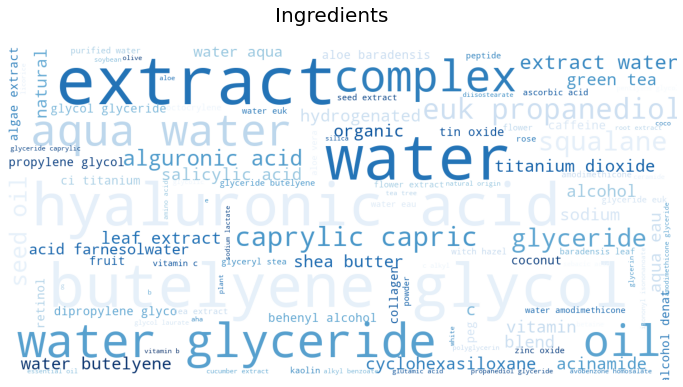

In [66]:
# Plot WordCloud 
show_wordcloud(df_combined['ingredients_list'], 'Ingredients', 'Blues')

# Save plot
plt.savefig('../plots/wordcloud_ingr.png', dpi=150, bbox_inches='tight')

## 4.2. Unigrams of Ingredients

In [67]:
# Use cvec to visualise unigrams 
cv = CountVectorizer(stop_words='english', min_df=3)
cv.fit(df_combined['ingredients_list'])

text_cv = cv.transform(df_combined['ingredients_list'])
text_cv_df = pd.DataFrame(text_cv.todense(), columns=cv.get_feature_names())

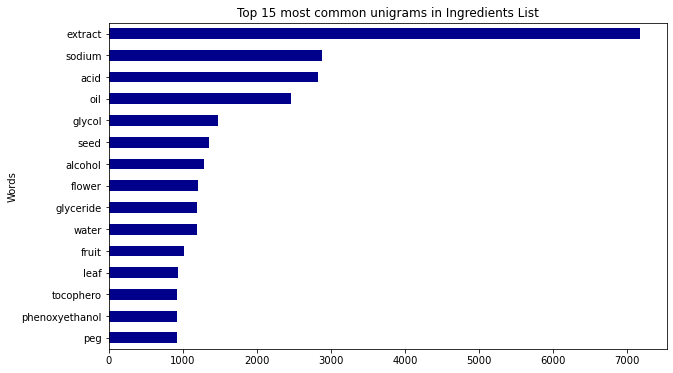

peg                922
phenoxyethanol     923
tocophero          929
leaf               938
fruit             1024
water             1191
glyceride         1193
flower            1206
alcohol           1282
seed              1350
glycol            1482
oil               2465
acid              2828
sodium            2876
extract           7170
dtype: int64


In [68]:
# Show 15 most common unigrams
cv_unigrams = text_cv_df.sum().sort_values(ascending=False).head(15).sort_values(ascending=True)

# Plot top 15 most common unigrams 
cv_unigrams.plot(kind='barh', title='Top 15 most common unigrams in Ingredients List', xlabel ='Words',
           figsize=(10, 6), color ='darkblue')

# Save plot
plt.savefig('../plots/ingr_unigram.png', dpi=150, bbox_inches='tight')

plt.show()

print(cv_unigrams)

## 4.3. Bigrams of Ingredients

In [69]:
# 15 most common bigrams 
cv_bigrams = CountVectorizer(ngram_range=(2, 2), stop_words='english')
cv_bigrams.fit(df_combined['ingredients_list'])

text_cv_bigrams = cv_bigrams.transform(df_combined['ingredients_list'])
text_cv_bigrams_df = pd.DataFrame(text_cv_bigrams.todense(), columns=cv_bigrams.get_feature_names())

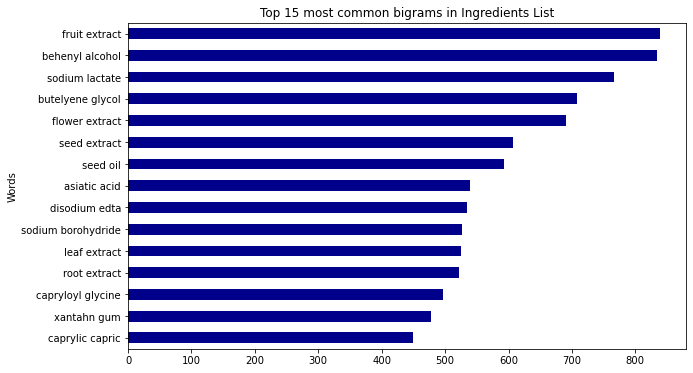

caprylic capric       450
xantahn gum           478
capryloyl glycine     496
root extract          522
leaf extract          525
sodium borohydride    526
disodium edta         535
asiatic acid          539
seed oil              593
seed extract          607
flower extract        690
butelyene glycol      708
sodium lactate        766
behenyl alcohol       834
fruit extract         838
dtype: int64


In [70]:
# Show 15 most bigrams
cv_bigrams = text_cv_bigrams_df.sum().sort_values(ascending=False).head(15).sort_values(ascending=True)


# Plot top 15 most common bigrams
cv_bigrams.plot(kind='barh', title='Top 15 most common bigrams in Ingredients List', xlabel ='Words',
                   figsize=(10, 6), color ='darkblue')

# Save plot
plt.savefig('../plots/ingr_bigram.png', dpi=150, bbox_inches='tight')

plt.show()

print(cv_bigrams)

## 4.3. Trigrams of Ingredients

In [71]:
# 15 most common trigrams 
cv_trigrams = CountVectorizer(ngram_range=(3, 3), stop_words='english')
cv_trigrams.fit(df_combined['ingredients_list'])

text_cv_trigrams = cv_trigrams.transform(df_combined['ingredients_list'])
text_cv_trigrams_df = pd.DataFrame(text_cv_trigrams.todense(), columns=cv_trigrams.get_feature_names())

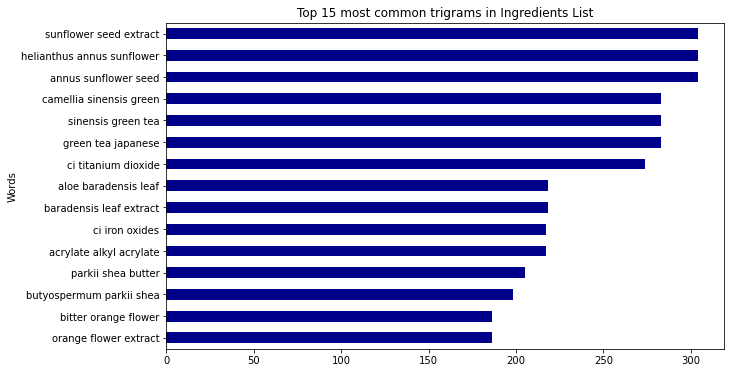

orange flower extract         186
bitter orange flower          186
butyospermum parkii shea      198
parkii shea butter            205
acrylate alkyl acrylate       217
ci iron oxides                217
baradensis leaf extract       218
aloe baradensis leaf          218
ci titanium dioxide           274
green tea japanese            283
sinensis green tea            283
camellia sinensis green       283
annus sunflower seed          304
helianthus annus sunflower    304
sunflower seed extract        304
dtype: int64


In [72]:
# Show 15 most trigrams 
cv_trigrams = text_cv_trigrams_df.sum().sort_values(ascending=False).head(15).sort_values(ascending=True)

# Plot top 15 most common trigrams for Samsung
cv_trigrams.plot(kind='barh', title='Top 15 most common trigrams in Ingredients List', xlabel ='Words',
                    figsize=(10, 6), color ='darkblue')

# Save plot
plt.savefig('../plots/ingr_trigram.png', dpi=150, bbox_inches='tight')

plt.show()

print(cv_trigrams)